## Import packages and define project paths

This cell imports the required packages and sets the main folders for reading TE summary files and saving diagnostic outputs.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path
import seaborn as sns
import random
from matplotlib.backends.backend_pdf import PdfPages
from PyPDF2 import PdfReader
import matplotlib.dates as mdates
np.seterr(all="ignore")
from matplotlib.colors import ListedColormap, BoundaryNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

In [2]:
# Project paths
PROJECT_DIR = Path.cwd()

OUT_SUMMARY = PROJECT_DIR / "outputs" / "summary_csv"
OUT_PDF = PROJECT_DIR / "outputs" / "pdf"
OUT_LOGS = PROJECT_DIR / "outputs" / "logs"

OUT_SUMMARY.mkdir(parents=True, exist_ok=True)
OUT_PDF.mkdir(parents=True, exist_ok=True)
OUT_LOGS.mkdir(parents=True, exist_ok=True)

print("PROJECT_DIR =", PROJECT_DIR)
print("OUT_SUMMARY =", OUT_SUMMARY)
print("OUT_PDF =", OUT_PDF)
print("OUT_LOGS =", OUT_LOGS)

PROJECT_DIR = c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins
OUT_SUMMARY = c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\summary_csv
OUT_PDF = c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf
OUT_LOGS = c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\logs


## Define INFO class

This cell defines the histogram-based information theory class used to compute entropy, mutual information, and conditional mutual information.

## Mutual Information of Tair and streamflow vs lag

This cell defines a function to compute MI between Tair(t-τ) and Q(t) for τ = 1 to 30, using the same histogram-based INFO class as the TE analysis.

In [3]:
# Define INFO class

class INFO(object):
    """
    A unified class that combines histogramming and information-theoretic
    metrics: Entropy, MI, and CMI/TE.
    """

    def __init__(self, data, bins, ranges=None, weights=None, base=np.e):
        self.base = base

        if isinstance(data, pd.DataFrame):
            data = data.values

        self.data = data
        self.bins = bins
        self.ranges = ranges

        # Remove invalid rows only inside this calculation
        data = data[~np.isnan(data).any(axis=1)]

        # N = number of samples, D = number of variables
        self.N, self.D = data.shape

        pdf, self.edges = np.histogramdd(
            data,
            bins=bins,
            range=ranges,
            weights=weights,
            density=False
        )

        pdf_sum = pdf.sum()
        if pdf_sum == 0:
            raise ValueError("The histogram resulted in a zero total count.")

        self.pdf = pdf / pdf_sum
        assert np.isclose(self.pdf.sum(), 1.0)

    def computeEntropy(self, dims):
        base, D = self.base, self.D
        all_dims = set(range(D))

        if all_dims == set(dims):
            pdf_dim = self.pdf
        else:
            pdf_dim = self.pdf.sum(axis=tuple(all_dims - set(dims)))

        log_pdf_dim = np.ma.filled(np.log(np.ma.masked_equal(pdf_dim, 0)), 0)
        ent = -np.sum(pdf_dim * log_pdf_dim / np.log(base))
        return ent

    def computeCondEntropy(self, dims, dimsc):
        hxc = self.computeEntropy(dims + dimsc)
        hc = self.computeEntropy(dimsc)
        hx_c = hxc - hc
        return hx_c

    def computeMI(self, dims1, dims2):
        h12 = self.computeEntropy(dims1 + dims2)
        h1 = self.computeEntropy(dims1)
        h2 = self.computeEntropy(dims2)
        mi = h1 + h2 - h12
        return mi

    def computeCMI(self, dims1, dims2, dimsc):
        h12c = self.computeEntropy(dims1 + dims2 + dimsc)
        h1cc = self.computeEntropy(dims1 + dimsc)
        h2cc = self.computeEntropy(dims2 + dimsc)
        hc = self.computeEntropy(dimsc)
        cmi = h1cc + h2cc - h12c - hc
        return cmi

## Define MI and correlation helper functions

This cell defines helper functions to compute lagged MI and lagged Pearson correlation between source(t−τ) and Q(t), and to build year × lag tables for τ = 1 to 30.

In [4]:
# Define MI helper function and correlation analysis

def mutual_information_lag(xdata, ydata, bins, base=np.e, lag=1):
    """
    Compute MI between xdata(t-lag) and ydata(t).
    Example: I(Tair(t-lag); Q(t))
    """
    yt = ydata[lag:]
    x_lag = xdata[:-lag]

    if len(yt) == 0 or len(x_lag) == 0:
        return np.nan

    data = np.column_stack([yt, x_lag])

    info = INFO(data, bins=bins, base=base)
    mi_value = info.computeMI(dims1=[1], dims2=[0])
    return mi_value


def corr_lag(xdata, ydata, lag=1):
    """
    Compute Pearson correlation between xdata(t-lag) and ydata(t).
    Example: corr(Tair(t-lag), Q(t))
    """
    y_t = ydata[lag:]
    x_lag = xdata[:-lag]

    if len(x_lag) == 0 or len(y_t) == 0:
        return np.nan

    valid_mask = (~np.isnan(x_lag)) & (~np.isnan(y_t))
    x_valid = x_lag[valid_mask]
    y_valid = y_t[valid_mask]

    if len(x_valid) < 2:
        return np.nan

    corr_val = np.corrcoef(x_valid, y_valid)[0, 1]
    return corr_val


def build_year_lag_mi_table(df, source_col="Tair", target_col="Q", max_lag=30, bins=5, base=np.e):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df[source_col] = pd.to_numeric(df[source_col], errors="coerce")
    df[target_col] = pd.to_numeric(df[target_col], errors="coerce")

    # Convert invalid Q flag to NaN
    df.loc[df[target_col] == -999, target_col] = np.nan

    df["Year"] = df["Date"].dt.year

    records = []

    for year in sorted(df["Year"].dropna().unique()):
        year_df = df[df["Year"] == year].copy().reset_index(drop=True)

        xdata = year_df[source_col].values
        ydata = year_df[target_col].values

        for lag in range(1, max_lag + 1):
            mi_val = mutual_information_lag(
                xdata=xdata,
                ydata=ydata,
                bins=bins,
                base=base,
                lag=lag
            )

            log_mi_val = np.log(mi_val) if pd.notna(mi_val) and mi_val > 0 else np.nan

            records.append({
                "Year": int(year),
                "Lag": lag,
                "MI": mi_val,
                "Log_MI": log_mi_val
            })

    mi_df = pd.DataFrame(records)
    mi_pivot = mi_df.pivot(index="Year", columns="Lag", values="MI")
    log_mi_pivot = mi_df.pivot(index="Year", columns="Lag", values="Log_MI")

    return mi_df, mi_pivot, log_mi_pivot


def build_year_lag_corr_table(df, source_col="Tair", target_col="Q", max_lag=30):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df[source_col] = pd.to_numeric(df[source_col], errors="coerce")
    df[target_col] = pd.to_numeric(df[target_col], errors="coerce")

    # Convert invalid Q flag to NaN
    df.loc[df[target_col] <0, target_col] = np.nan

    df["Year"] = df["Date"].dt.year

    records = []

    for year in sorted(df["Year"].dropna().unique()):
        year_df = df[df["Year"] == year].copy().reset_index(drop=True)

        xdata = year_df[source_col].values
        ydata = year_df[target_col].values

        for lag in range(1, max_lag + 1):
            corr_val = corr_lag(
                xdata=xdata,
                ydata=ydata,
                lag=lag
            )

            records.append({
                "Year": int(year),
                "Lag": lag,
                "Correlation": corr_val
            })

    corr_df = pd.DataFrame(records)
    corr_pivot = corr_df.pivot(index="Year", columns="Lag", values="Correlation")

    return corr_df, corr_pivot

## Load shuffle-test TE results

This cell reads the shuffle-significant TE summary file that we will use to select 3 example basins.

In [5]:
# Load shuffle-test TE results

TE_PROJECT_DIR = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\ALL CAMELS BASIN (FORCINGS TO STREAMFLOW)"
)

shuffle_file = TE_PROJECT_DIR / "outputs" / "summary_csv" / "TE_shuffle_all671_tau1_30_PRCPspecial_bins5.csv"

print("shuffle_file exists:", shuffle_file.exists())
print("shuffle_file path:", shuffle_file)

te_shuffle_df = pd.read_csv(shuffle_file)

print("Shape:", te_shuffle_df.shape)
print("Columns:", te_shuffle_df.columns.tolist())

display(te_shuffle_df.head())

shuffle_file exists: True
shuffle_file path: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\ALL CAMELS BASIN (FORCINGS TO STREAMFLOW)\outputs\summary_csv\TE_shuffle_all671_tau1_30_PRCPspecial_bins5.csv
Shape: (80520, 10)
Columns: ['gauge_id', 'huc_02', 'Source', 'Target', 'Bins', 'Lag', 'TE_obs', 'thr95', 'pval', 'sig']


,gauge_id,huc_02,Source,Target,Bins,Lag,TE_obs,thr95,pval,sig
0,1013500,1,PRCP,Q,5,1,0.002761,0.001187,0.004975,True
1,1013500,1,PRCP,Q,5,2,0.001754,0.001171,0.004975,True
2,1013500,1,PRCP,Q,5,3,0.001439,0.001204,0.009950,True
3,1013500,1,PRCP,Q,5,4,0.000913,0.001174,0.258706,False
4,1013500,1,PRCP,Q,5,5,0.001240,0.001064,0.024876,True


In [6]:
# Keep only significant TE rows
sig_df = te_shuffle_df[te_shuffle_df["sig"] == True].copy()

# For each basin and source, keep the row with maximum significant TE
idx_source_peak = sig_df.groupby(["gauge_id", "Source"])["TE_obs"].idxmax()
source_peak_df = sig_df.loc[idx_source_peak].copy()

# For each basin, keep the forcing with the overall maximum significant TE
idx_basin_dom = source_peak_df.groupby("gauge_id")["TE_obs"].idxmax()
dominant_sig_df = source_peak_df.loc[idx_basin_dom].copy()

dominant_sig_df = dominant_sig_df.rename(columns={
    "Source": "dominant_forcing",
    "Lag": "peak_lag",
    "TE_obs": "peak_te"
})

print("Number of basins with at least one significant TE link:", len(dominant_sig_df))
print(dominant_sig_df["dominant_forcing"].value_counts())

Number of basins with at least one significant TE link: 671
dominant_forcing
PRCP    389
SRAD    156
Tair     95
VP       31
Name: count, dtype: int64


## Compare raw dominant forcing vs shuffle-significant dominant forcing

This step checks whether PRCP increases after shuffle significance filtering
because other forcings lose significance.

In [7]:
# Load raw TE results (long format)
raw_te_df = pd.read_csv(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\ALL CAMELS BASIN (FORCINGS TO STREAMFLOW)\outputs\summary_csv\TE_AllBasins_tau1_30_PRCPspecial_bins5.csv"
)

print(raw_te_df.shape)
print(raw_te_df.columns.tolist())
display(raw_te_df.head())

(80520, 7)
['gauge_id', 'huc_02', 'Source', 'Target', 'Bins', 'Lag', 'TE_nats']


,gauge_id,huc_02,Source,Target,Bins,Lag,TE_nats
0,1013500,1,PRCP,Q,5,1,0.002761
1,1013500,1,PRCP,Q,5,2,0.001754
2,1013500,1,PRCP,Q,5,3,0.001439
3,1013500,1,PRCP,Q,5,4,0.000913
4,1013500,1,PRCP,Q,5,5,0.001240


In [8]:
# Make gauge_id string
raw_te_df["gauge_id"] = raw_te_df["gauge_id"].astype(str).str.zfill(8)

# choose the TE column name in your file
# change this if your column is TE_nats or TE_obs or something else
te_col = "TE_nats"   # <- check this name from printed columns

# For each basin and source, keep maximum TE across lags
idx_source_peak = raw_te_df.groupby(["gauge_id", "Source"])[te_col].idxmax()
raw_source_peak_df = raw_te_df.loc[idx_source_peak].copy()

# For each basin, keep forcing with overall maximum TE
idx_basin_dom = raw_source_peak_df.groupby("gauge_id")[te_col].idxmax()
raw_dom = raw_source_peak_df.loc[idx_basin_dom].copy()

raw_dom = raw_dom.rename(columns={"Source": "raw_dominant"})
raw_dom = raw_dom[["gauge_id", "raw_dominant"]].copy()

print("Raw dominant counts:")
print(raw_dom["raw_dominant"].value_counts())

Raw dominant counts:
raw_dominant
PRCP    388
SRAD    157
Tair     95
VP       31
Name: count, dtype: int64


In [9]:
# shuffle-significant dominant forcing table
sig_dom = dominant_sig_df.copy()
sig_dom["gauge_id"] = sig_dom["gauge_id"].astype(str).str.zfill(8)
sig_dom = sig_dom[["gauge_id", "dominant_forcing"]].rename(
    columns={"dominant_forcing": "sig_dominant"}
)

# merge
cmp_df = raw_dom.merge(sig_dom, on="gauge_id", how="inner")

print("Merged basins:", len(cmp_df))
print()

print("Raw dominant counts:")
print(cmp_df["raw_dominant"].value_counts())
print()

print("Shuffle-significant dominant counts:")
print(cmp_df["sig_dominant"].value_counts())
print()

print("Cross-tab:")
display(pd.crosstab(cmp_df["raw_dominant"], cmp_df["sig_dominant"]))

changed_df = cmp_df[cmp_df["raw_dominant"] != cmp_df["sig_dominant"]].copy()

print("Number of basins where dominant forcing changed after shuffle filter:", len(changed_df))
print("How many changed TO PRCP?", (changed_df["sig_dominant"] == "PRCP").sum())

display(changed_df.head(30))

Merged basins: 671

Raw dominant counts:
raw_dominant
PRCP    388
SRAD    157
Tair     95
VP       31
Name: count, dtype: int64

Shuffle-significant dominant counts:
sig_dominant
PRCP    389
SRAD    156
Tair     95
VP       31
Name: count, dtype: int64

Cross-tab:


sig_dominant,PRCP,SRAD,Tair,VP
raw_dominant,,,,
PRCP,388,0,0,0
SRAD,1,156,0,0
Tair,0,0,95,0
VP,0,0,0,31


Number of basins where dominant forcing changed after shuffle filter: 1
How many changed TO PRCP? 1


,gauge_id,raw_dominant,sig_dominant
364,06470800,SRAD,PRCP


## Check whether original TE and shuffle TE_obs match row by row

This step compares the original TE table and the shuffle-test TE table for one basin, source, and lag.
If shuffle is working as a filter only, then TE_nats and TE_obs should match.

In [10]:
# Example basin
check_gauge = "01047000"

# make sure gauge_id is string in both
orig_df = raw_te_df.copy()
orig_df["gauge_id"] = orig_df["gauge_id"].astype(str).str.zfill(8)

shuf_df = te_shuffle_df.copy()
shuf_df["gauge_id"] = shuf_df["gauge_id"].astype(str).str.zfill(8)

# keep needed columns
orig_sub = orig_df.loc[orig_df["gauge_id"] == check_gauge, ["gauge_id", "Source", "Lag", "TE_nats"]].copy()
shuf_sub = shuf_df.loc[shuf_df["gauge_id"] == check_gauge, ["gauge_id", "Source", "Lag", "TE_obs", "sig", "pval"]].copy()

# merge row by row
cmp = orig_sub.merge(
    shuf_sub,
    on=["gauge_id", "Source", "Lag"],
    how="outer"
)

cmp["diff"] = cmp["TE_nats"] - cmp["TE_obs"]

print("Rows in comparison:", len(cmp))
display(cmp.sort_values(["Source", "Lag"]))

print("Rows where TE_nats != TE_obs:")
display(cmp.loc[cmp["diff"].abs() > 1e-12].sort_values(["Source", "Lag"]))

Rows in comparison: 120


,gauge_id,Source,Lag,TE_nats,TE_obs,sig,pval,diff
0,01047000,PRCP,1,0.002277,0.002277,True,0.004975,0.0
1,01047000,PRCP,2,0.000580,0.000580,False,0.079602,0.0
2,01047000,PRCP,3,0.000582,0.000582,False,0.074627,0.0
3,01047000,PRCP,4,0.000325,0.000325,False,0.442786,0.0
4,01047000,PRCP,5,0.000188,0.000188,False,0.870647,0.0
...,...,...,...,...,...,...,...,...
115,01047000,VP,26,0.000686,0.000686,False,0.174129,0.0
116,01047000,VP,27,0.000514,0.000514,False,0.437811,0.0
117,01047000,VP,28,0.000840,0.000840,True,0.054726,0.0
118,01047000,VP,29,0.000656,0.000656,False,0.169154,0.0


Rows where TE_nats != TE_obs:


,gauge_id,Source,Lag,TE_nats,TE_obs,sig,pval,diff


## Select 3 example basins from shuffle-significant TE

This cell keeps only significant TE results, finds the dominant forcing and peak lag for each basin, and selects:
- 1 PRCP-dominant basin with peak lag 1 or 2
- 2 Tair-dominant basins with peak lag greater than 15

In [11]:
# Identify candidate example basins from shuffle-significant TE

# Keep only significant TE rows
sig_df = te_shuffle_df[te_shuffle_df["sig"]].copy()

# For each basin and source, keep the row with maximum significant TE
idx_source_peak = sig_df.groupby(["gauge_id", "Source"])["TE_obs"].idxmax()
source_peak_df = sig_df.loc[idx_source_peak].copy()

# For each basin, keep the forcing with the overall maximum significant TE
idx_basin_dom = source_peak_df.groupby("gauge_id")["TE_obs"].idxmax()
dominant_sig_df = source_peak_df.loc[idx_basin_dom].copy()

dominant_sig_df = dominant_sig_df.rename(columns={
    "Source": "dominant_forcing",
    "Lag": "peak_lag",
    "TE_obs": "peak_te"
})

dominant_sig_df = dominant_sig_df.sort_values(
    ["dominant_forcing", "peak_lag", "gauge_id"]
).reset_index(drop=True)

print("Number of basins with at least one significant TE link:", len(dominant_sig_df))
print()
print("Dominant forcing counts from shuffle-significant TE:")
print(dominant_sig_df["dominant_forcing"].value_counts())

# Candidate groups
prcp_candidates = dominant_sig_df[
    (dominant_sig_df["dominant_forcing"] == "PRCP") &
    (dominant_sig_df["peak_lag"].isin([1, 2]))
].copy()

tair_candidates = dominant_sig_df[
    (dominant_sig_df["dominant_forcing"] == "Tair") &
    (dominant_sig_df["peak_lag"] > 15)
].copy()

print("\nPRCP-dominant candidates with peak lag 1 or 2:")
display(prcp_candidates[["gauge_id", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]].head(20))

print("\nTair-dominant candidates with peak lag > 15:")
display(tair_candidates[["gauge_id", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]].head(20))

Number of basins with at least one significant TE link: 671

Dominant forcing counts from shuffle-significant TE:
dominant_forcing
PRCP    389
SRAD    156
Tair     95
VP       31
Name: count, dtype: int64

PRCP-dominant candidates with peak lag 1 or 2:


,gauge_id,huc_02,dominant_forcing,peak_lag,peak_te,pval
0,1022500,1,PRCP,1,0.016681,0.004975
1,1030500,1,PRCP,1,0.013428,0.004975
2,1031500,1,PRCP,1,0.003859,0.004975
3,1047000,1,PRCP,1,0.002277,0.004975
4,1057000,1,PRCP,1,0.002255,0.004975
5,1073000,1,PRCP,1,0.005689,0.004975
6,1078000,1,PRCP,1,0.004031,0.004975
7,1118300,1,PRCP,1,0.004119,0.004975
8,1123000,1,PRCP,1,0.005325,0.004975
9,1134500,1,PRCP,1,0.007742,0.004975



Tair-dominant candidates with peak lag > 15:


,gauge_id,huc_02,dominant_forcing,peak_lag,peak_te,pval
582,3384450,5,Tair,16,0.003085,0.004975
583,6468170,10,Tair,16,0.001797,0.029851
584,3015500,5,Tair,17,0.004331,0.004975
585,6350000,10,Tair,17,0.002440,0.014925
586,1516500,2,Tair,19,0.002384,0.004975
587,4224775,4,Tair,19,0.002912,0.004975
588,2464146,3,Tair,20,0.001338,0.004975
589,3159540,5,Tair,21,0.003351,0.004975
590,1605500,2,Tair,22,0.000611,0.019900
591,3076600,5,Tair,22,0.004907,0.004975


## Select final basins from candidate tables

This cell selects the final 3 example basins directly from the previously created candidate tables.

In [12]:
# Select final basins directly from candidate tables

# Make sure gauge_id has leading zeros
dominant_sig_df["gauge_id"] = dominant_sig_df["gauge_id"].astype(str).str.zfill(8)
prcp_candidates["gauge_id"] = prcp_candidates["gauge_id"].astype(str).str.zfill(8)
tair_candidates["gauge_id"] = tair_candidates["gauge_id"].astype(str).str.zfill(8)

# Reset index so row-based selection is stable
prcp_candidates = prcp_candidates.reset_index(drop=True)
tair_candidates = tair_candidates.reset_index(drop=True)

# Pick final basins from candidate table rows
prcp_pick = prcp_candidates.loc[0, ["gauge_id", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]]
tair_pick_1 = tair_candidates.loc[7, ["gauge_id", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]]
tair_pick_2 = tair_candidates.loc[16, ["gauge_id", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]]

selected_basins = pd.DataFrame([prcp_pick, tair_pick_1, tair_pick_2]).reset_index(drop=True)
selected_basins["expected_type"] = ["PRCP_shortlag", "Tair_longlag", "Tair_longlag"]

display(selected_basins[["gauge_id", "expected_type", "huc_02", "dominant_forcing", "peak_lag", "peak_te", "pval"]])

,gauge_id,expected_type,huc_02,dominant_forcing,peak_lag,peak_te,pval
0,01022500,PRCP_shortlag,1,PRCP,1,0.016681,0.004975
1,03159540,Tair_longlag,5,Tair,21,0.003351,0.004975
2,06353000,Tair_longlag,10,Tair,23,0.002518,0.004975


## Load merged daily data for the 3 selected basins

This cell reads the merged daily CSV files for the selected basins and stores them in a dictionary for later MI and time-series analysis.

In [13]:
# Load merged daily data for the 3 selected basins

selected_basins["gauge_id"] = selected_basins["gauge_id"].astype(str).str.zfill(8)

MERGED_DIR = TE_PROJECT_DIR / "outputs" / "merged_csv"

basin_data = {}

for gid in selected_basins["gauge_id"]:
    file_path = MERGED_DIR / f"{gid}_merged_forcing_q.csv"

    if not file_path.exists():
        print(f"Missing file: {file_path.name}")
        continue

    print(f"Reading: {file_path.name}")

    df = pd.read_csv(file_path)
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    basin_data[gid] = df

    print(f"  shape = {df.shape}, date range = {df['Date'].min().date()} to {df['Date'].max().date()}")

print("\nLoaded basins:")
print(list(basin_data.keys()))

Reading: 01022500_merged_forcing_q.csv
  shape = (12784, 6), date range = 1980-01-01 to 2014-12-31
Reading: 03159540_merged_forcing_q.csv
  shape = (12784, 6), date range = 1980-01-01 to 2014-12-31
Reading: 06353000_merged_forcing_q.csv
  shape = (12784, 6), date range = 1980-01-01 to 2014-12-31

Loaded basins:
['01022500', '03159540', '06353000']


## Compute MI of Tair and streamflow vs lag

This cell computes MI(Tair(t-τ), Q(t)) for τ = 1 to 30 for the 3 selected basins.

In [14]:
print("Number of negative Q values:", (df["Q"] < 0).sum())
print("Minimum Q:", df["Q"].min())

Number of negative Q values: 56
Minimum Q: -999.0


In [15]:
# Compute MI of Tair and streamflow vs lag

lags = range(1, 31)
bins = 5

mi_records = []

for gid in selected_basins["gauge_id"]:
    df = basin_data[gid].copy()

    df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan
    
    
    xdata = df["Tair"].values
    ydata = df["Q"].values

    for lag in lags:
        mi_val = mutual_information_lag(
            xdata=xdata,
            ydata=ydata,
            bins=bins,
            base=np.e,
            lag=lag
        )

        mi_records.append({
            "gauge_id": gid,
            "lag": lag,
            "MI_nats": mi_val
        })

mi_df = pd.DataFrame(mi_records)

display(mi_df.head(10))
print("Shape:", mi_df.shape)

,gauge_id,lag,MI_nats
0,01022500,1,0.026057
1,01022500,2,0.024431
2,01022500,3,0.021424
3,01022500,4,0.021251
4,01022500,5,0.020279
5,01022500,6,0.019803
6,01022500,7,0.019458
7,01022500,8,0.019759
8,01022500,9,0.020395
9,01022500,10,0.020106


Shape: (90, 3)


## Check selected basin columns

This cell checks the columns currently stored in the selected basin table.

In [16]:
print(selected_basins.columns.tolist())
display(selected_basins)

['gauge_id', 'huc_02', 'dominant_forcing', 'peak_lag', 'peak_te', 'pval', 'expected_type']


,gauge_id,huc_02,dominant_forcing,peak_lag,peak_te,pval,expected_type
0,01022500,1,PRCP,1,0.016681,0.004975,PRCP_shortlag
1,03159540,5,Tair,21,0.003351,0.004975,Tair_longlag
2,06353000,10,Tair,23,0.002518,0.004975,Tair_longlag


## Plot mutual information of Tair and streamflow vs lag

This cell plots I(Tair; Q) versus lag τ = 1 to 30 for the 3 selected basins and marks the TE peak lag with a dashed line.## Compute MI curves needed for the 3 diagnostic figures

This cell computes:
- MI(PRCP; Q) for basin 01022500
- MI(Tair; Q) for basin 01022500
- MI(Tair; Q) for basins 03159540 and 06353000

In [17]:
lags = range(1, 31)
bins = 5

mi_plot_records = []

# Basin 1: PRCP and Tair
for source_var in ["PRCP", "Tair"]:
    gid = "01022500"
    df = basin_data[gid].copy()

    df[source_var] = pd.to_numeric(df[source_var], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan

    xdata = df[source_var].values
    ydata = df["Q"].values

    for lag in lags:
        mi_val = mutual_information_lag(xdata, ydata, bins=bins, base=np.e, lag=lag)

        mi_plot_records.append({
            "gauge_id": gid,
            "source_var": source_var,
            "lag": lag,
            "MI_nats": mi_val
        })

# Basin 2 and 3: Tair only
for gid in ["03159540", "06353000"]:
    df = basin_data[gid].copy()

    df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan

    xdata = df["Tair"].values
    ydata = df["Q"].values

    for lag in lags:
        mi_val = mutual_information_lag(xdata, ydata, bins=bins, base=np.e, lag=lag)

        mi_plot_records.append({
            "gauge_id": gid,
            "source_var": "Tair",
            "lag": lag,
            "MI_nats": mi_val
        })

mi_plot_df = pd.DataFrame(mi_plot_records)

display(mi_plot_df.head(10))
print("Shape:", mi_plot_df.shape)

,gauge_id,source_var,lag,MI_nats
0,01022500,PRCP,1,0.025389
1,01022500,PRCP,2,0.019236
2,01022500,PRCP,3,0.011979
3,01022500,PRCP,4,0.005290
4,01022500,PRCP,5,0.003451
5,01022500,PRCP,6,0.002168
6,01022500,PRCP,7,0.001341
7,01022500,PRCP,8,0.001498
8,01022500,PRCP,9,0.000932
9,01022500,PRCP,10,0.000743


Shape: (120, 4)


## Plot the 3 MI diagnostic figures

This cell creates:
1. MI(PRCP; Q) vs lag for basin 01022500
2. MI(Tair; Q) vs lag for basin 01022500
3. MI(Tair; Q) vs lag for basins 03159540 and 06353000 together

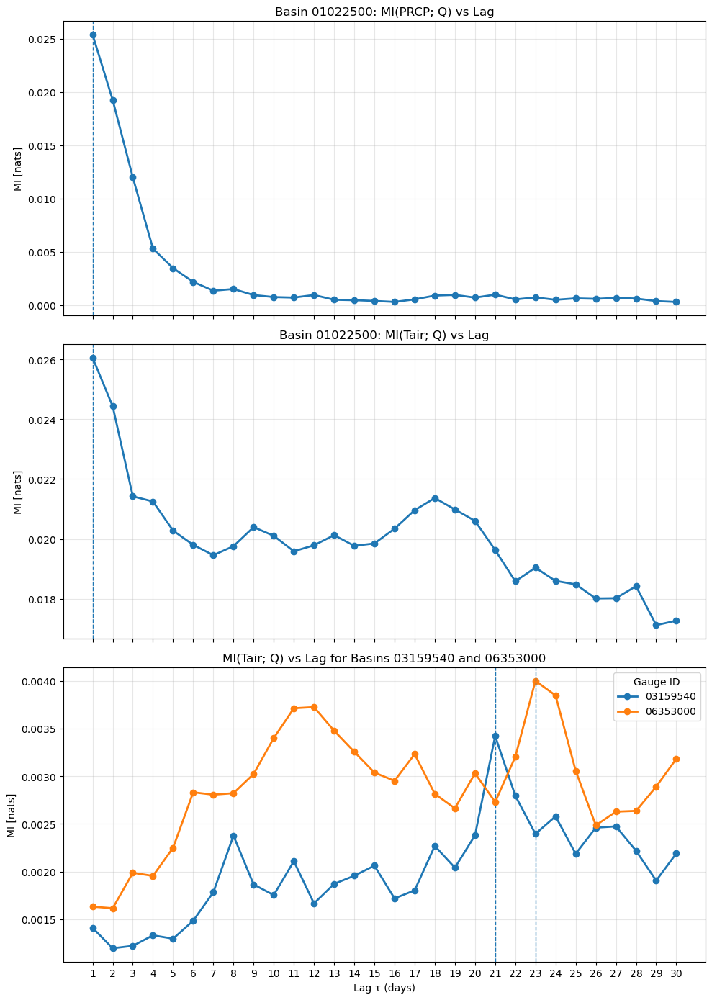

In [18]:
## Plot the 3 MI diagnostic figures

fig, axes = plt.subplots(3, 1, figsize=(10, 14), sharex=True)

# 1. MI(PRCP; Q) vs lag for basin 01022500
sub1 = mi_plot_df[
    (mi_plot_df["gauge_id"] == "01022500") &
    (mi_plot_df["source_var"] == "PRCP")
].copy()

axes[0].plot(sub1["lag"], sub1["MI_nats"], marker="o", linewidth=2)
axes[0].axvline(1, linestyle="--", linewidth=1)
axes[0].set_ylabel("MI [nats]")
axes[0].set_title("Basin 01022500: MI(PRCP; Q) vs Lag")
axes[0].grid(True, alpha=0.3)

# 2. MI(Tair; Q) vs lag for basin 01022500
sub2 = mi_plot_df[
    (mi_plot_df["gauge_id"] == "01022500") &
    (mi_plot_df["source_var"] == "Tair")
].copy()

axes[1].plot(sub2["lag"], sub2["MI_nats"], marker="o", linewidth=2)
axes[1].axvline(1, linestyle="--", linewidth=1)
axes[1].set_ylabel("MI [nats]")
axes[1].set_title("Basin 01022500: MI(Tair; Q) vs Lag")
axes[1].grid(True, alpha=0.3)

# 3. MI(Tair; Q) vs lag for basins 03159540 and 06353000
for gid in ["03159540", "06353000"]:
    sub3 = mi_plot_df[
        (mi_plot_df["gauge_id"] == gid) &
        (mi_plot_df["source_var"] == "Tair")
    ].copy()

    peak_lag = int(
        selected_basins.loc[selected_basins["gauge_id"] == gid, "peak_lag"].iloc[0]
    )

    axes[2].plot(sub3["lag"], sub3["MI_nats"], marker="o", linewidth=2, label=gid)
    axes[2].axvline(peak_lag, linestyle="--", linewidth=1)

axes[2].set_xlabel("Lag τ (days)")
axes[2].set_ylabel("MI [nats]")
axes[2].set_title("MI(Tair; Q) vs Lag for Basins 03159540 and 06353000")
axes[2].grid(True, alpha=0.3)
axes[2].legend(title="Gauge ID")

for ax in axes:
    ax.set_xticks(range(1, 31))

plt.tight_layout()
plt.show()

## Plot MI(Tair; Q) vs lag separately for the two Tair-dominant basins

This cell plots the two Tair-dominant basins in separate figures.

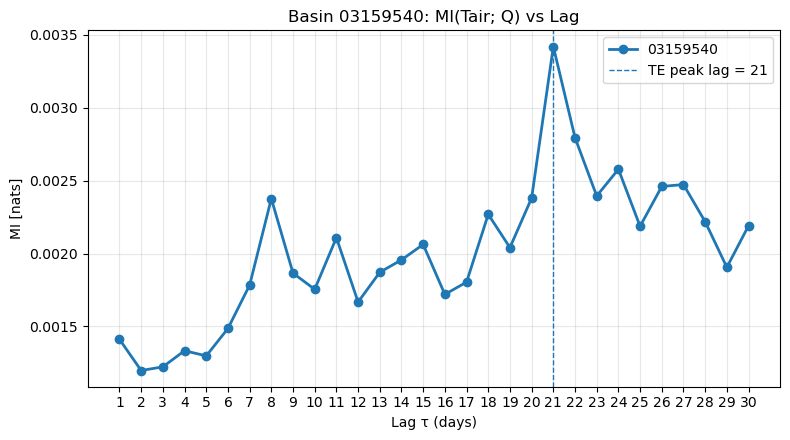

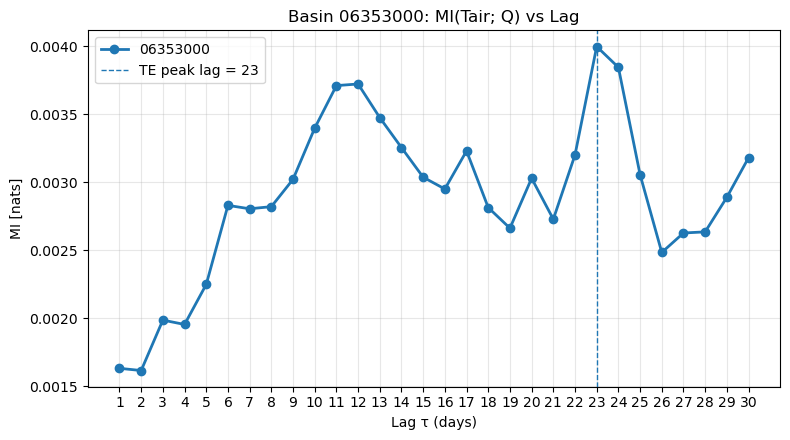

In [19]:
## Plot MI(Tair; Q) vs lag separately for the two Tair-dominant basins

for gid in ["03159540", "06353000"]:
    sub = mi_plot_df[
        (mi_plot_df["gauge_id"] == gid) &
        (mi_plot_df["source_var"] == "Tair")
    ].copy()

    peak_lag = int(
        selected_basins.loc[selected_basins["gauge_id"] == gid, "peak_lag"].iloc[0]
    )

    plt.figure(figsize=(8, 4.5))
    plt.plot(sub["lag"], sub["MI_nats"], marker="o", linewidth=2, label=gid)
    plt.axvline(peak_lag, linestyle="--", linewidth=1, label=f"TE peak lag = {peak_lag}")
    plt.xlabel("Lag τ (days)")
    plt.ylabel("MI [nats]")
    plt.title(f"Basin {gid}: MI(Tair; Q) vs Lag")
    plt.xticks(range(1, 31))
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Plot source forcing and streamflow for the 3 selected basins

This cell plots:
- source(t) and Q(t)
- source(t-τ) and Q(t)

using the dominant forcing and TE peak lag for each selected basin.

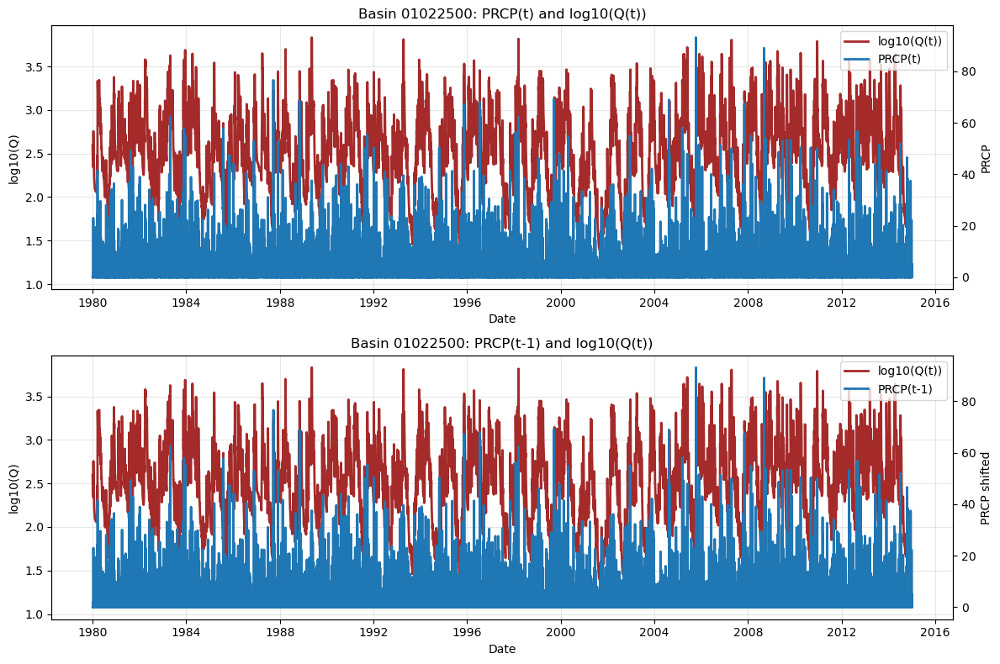

I(Tair(t-1); Q(t)) = 0.0014110574707588697
I(Tair(t-21); Q(t)) = 0.003420801293781084


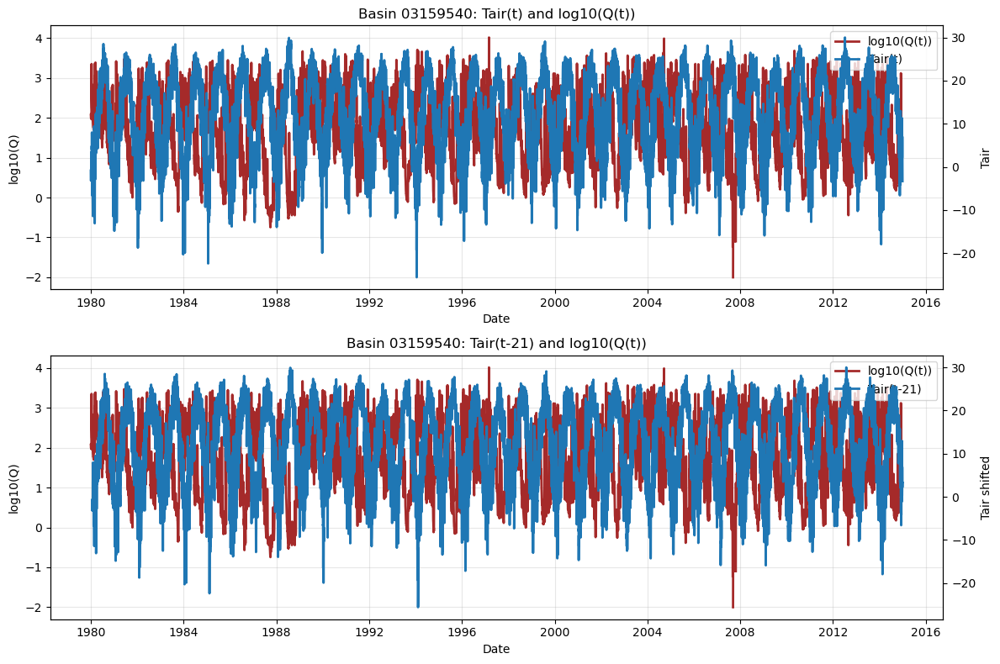

I(Tair(t-1); Q(t)) = 0.0016324482202498825
I(Tair(t-23); Q(t)) = 0.003999011152361787


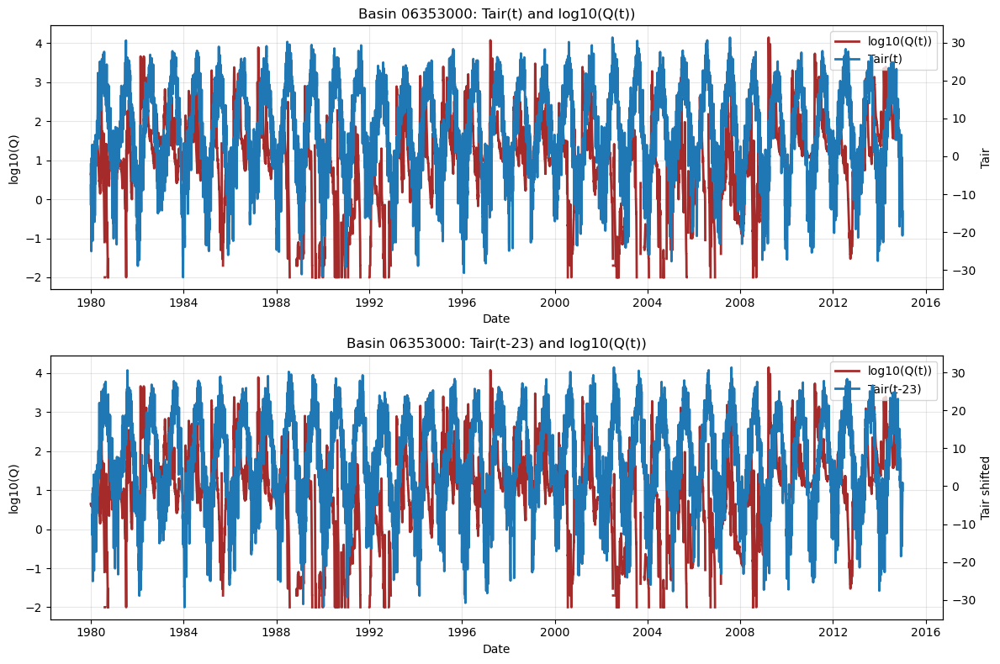

In [20]:
def plot_source_q_timeseries_dual_axis(df, gauge_id, source_var, peak_lag,
                                       custom_date=True,
                                       start_date="2014-03-01",
                                       end_date="2014-06-30"):
    """
    Plot:
    1. source(t) and log10(Q(t))
    2. source(t-tau) and log10(Q(t))

    custom_date = True  -> use selected date window
    custom_date = False -> use full record
    """

    plot_df = df.copy()
    plot_df["Date"] = pd.to_datetime(plot_df["Date"])
    plot_df = plot_df.sort_values("Date").reset_index(drop=True)

    # make numeric
    plot_df[source_var] = pd.to_numeric(plot_df[source_var], errors="coerce")
    plot_df["Q"] = pd.to_numeric(plot_df["Q"], errors="coerce")

    # remove invalid negative Q values like -999
    plot_df.loc[plot_df["Q"] < 0, "Q"] = np.nan

    if custom_date:
        plot_df = plot_df[
            (plot_df["Date"] >= pd.to_datetime(start_date)) &
            (plot_df["Date"] <= pd.to_datetime(end_date))
        ].copy()

    # safe log10(Q): only positive Q can be logged
    plot_df["log10_Q"] = np.where(plot_df["Q"] > 0, np.log10(plot_df["Q"]), np.nan)

    plot_df[f"{source_var}_shifted"] = plot_df[source_var].shift(int(peak_lag))

    fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=False)

    # Plot 1: source(t) and Q(t)
    ax1 = axes[0]
    ax2 = ax1.twinx()

    ax1.plot(plot_df["Date"], plot_df["log10_Q"], linewidth=2, label="log10(Q(t))", color="brown")
    ax2.plot(plot_df["Date"], plot_df[source_var], linewidth=2, label=f"{source_var}(t)")

    ax1.set_title(f"Basin {gauge_id}: {source_var}(t) and log10(Q(t))")
    ax1.set_xlabel("Date")
    ax1.set_ylabel("log10(Q)")
    ax2.set_ylabel(source_var)
    ax1.grid(True, alpha=0.3)

    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

    # Plot 2: source(t-tau) and Q(t)
    ax3 = axes[1]
    ax4 = ax3.twinx()

    ax3.plot(plot_df["Date"], plot_df["log10_Q"], linewidth=2, label="log10(Q(t))", color="brown")
    ax4.plot(plot_df["Date"], plot_df[f"{source_var}_shifted"], linewidth=2,
             label=f"{source_var}(t-{int(peak_lag)})")

    ax3.set_title(f"Basin {gauge_id}: {source_var}(t-{int(peak_lag)}) and log10(Q(t))")
    ax3.set_xlabel("Date")
    ax3.set_ylabel("log10(Q)")
    ax4.set_ylabel(f"{source_var} shifted")
    ax3.grid(True, alpha=0.3)

    lines3, labels3 = ax3.get_legend_handles_labels()
    lines4, labels4 = ax4.get_legend_handles_labels()
    ax3.legend(lines3 + lines4, labels3 + labels4, loc="upper right")

    plt.tight_layout()
    plt.show()


# settings
custom_date = True
start_date = "1980-01-01"
end_date = "2014-12-31"

# basin 1: 01022500 -> PRCP, lag 1
plot_source_q_timeseries_dual_axis(
    df=basin_data["01022500"],
    gauge_id="01022500",
    source_var="PRCP",
    peak_lag=1,
    custom_date=custom_date,
    start_date=start_date,
    end_date=end_date
)

# basin 2: 03159540 -> Tair, lag 21
df = basin_data["03159540"].copy()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date").reset_index(drop=True)
df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
df.loc[df["Q"] < 0, "Q"] = np.nan
df = df[(df["Date"] >= pd.to_datetime(start_date)) & (df["Date"] <= pd.to_datetime(end_date))].copy()

mi = mutual_information_lag(df["Tair"].values, df["Q"].values, bins=bins, base=np.e, lag=1)
print("I(Tair(t-1); Q(t)) =", mi)

mi = mutual_information_lag(df["Tair"].values, df["Q"].values, bins=bins, base=np.e, lag=21)
print("I(Tair(t-21); Q(t)) =", mi)

plot_source_q_timeseries_dual_axis(
    df=basin_data["03159540"],
    gauge_id="03159540",
    source_var="Tair",
    peak_lag=21,
    custom_date=custom_date,
    start_date=start_date,
    end_date=end_date
)

# basin 3: 06353000 -> Tair, lag 23
df = basin_data["06353000"].copy()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date").reset_index(drop=True)
df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
df.loc[df["Q"] < 0, "Q"] = np.nan
df = df[(df["Date"] >= pd.to_datetime(start_date)) & (df["Date"] <= pd.to_datetime(end_date))].copy()

mi = mutual_information_lag(df["Tair"].values, df["Q"].values, bins=bins, base=np.e, lag=1)
print("I(Tair(t-1); Q(t)) =", mi)

mi = mutual_information_lag(df["Tair"].values, df["Q"].values, bins=bins, base=np.e, lag=23)
print("I(Tair(t-23); Q(t)) =", mi)

plot_source_q_timeseries_dual_axis(
    df=basin_data["06353000"],
    gauge_id="06353000",
    source_var="Tair",
    peak_lag=23,
    custom_date=custom_date,
    start_date=start_date,
    end_date=end_date
)

## Save year-by-year Tair–Q comparison into basin-wise PDF

This cell creates one PDF per Tair-long-lag basin.  
Each PDF contains one page per year, with two panels:
1. Tair(t) and log10(Q(t))
2. Tair(t-max lag) and log10(Q(t))

It also writes the annual MI values and time window on each page.

In [21]:
# Output folder
OUT_PDF = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf"
)
OUT_PDF.mkdir(parents=True, exist_ok=True)

print("OUT_PDF =", OUT_PDF)
print("Exists  =", OUT_PDF.exists())


# helper: MI percent change
def compute_mi_percent_change(mi_lag1, mi_peak):
    if pd.isna(mi_lag1) or pd.isna(mi_peak):
        return np.nan
    if mi_lag1 == 0:
        return np.nan
    return ((mi_peak - mi_lag1) / mi_lag1) * 100.0


# helper: save one basin yearly PDF
def save_yearly_tair_q_pdf(df, gauge_id, basin_name, peak_lag, out_pdf):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan
    df["Year"] = df["Date"].dt.year

    years = sorted(df["Year"].dropna().unique())

    out_pdf = Path(out_pdf)
    out_pdf.parent.mkdir(parents=True, exist_ok=True)

    with PdfPages(str(out_pdf)) as pdf:
        for year in years:
            year_df = df[df["Year"] == year].copy().reset_index(drop=True)

            if len(year_df) <= peak_lag:
                continue

            # safe log10(Q)
            year_df["log10_Q"] = np.where(year_df["Q"] > 0, np.log10(year_df["Q"]), np.nan)

            # annual MI values
            xdata = year_df["Tair"].values
            ydata = year_df["Q"].values

            mi_lag1 = mutual_information_lag(xdata, ydata, bins=5, base=np.e, lag=1)
            mi_peak = mutual_information_lag(xdata, ydata, bins=5, base=np.e, lag=peak_lag)
            mi_pct_change = compute_mi_percent_change(mi_lag1, mi_peak)

            # shifted Tair for lower panel
            year_df["Tair_shifted"] = year_df["Tair"].shift(peak_lag)

            time_text = (
                f"Time window: {year_df['Date'].min().date()} to "
                f"{year_df['Date'].max().date()}"
            )

            if pd.isna(mi_pct_change):
                pct_text = "MI % change = NaN"
            else:
                pct_text = f"MI % change = {mi_pct_change:.2f}%"

            fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

            # top plot
            ax1 = axes[0]
            ax1r = ax1.twinx()

            ax1.plot(year_df["Date"], year_df["log10_Q"], linewidth=1.8, label="log10(Q(t))", color="brown")
            ax1r.plot(year_df["Date"], year_df["Tair"], linewidth=1.4, label="Tair(t)")

            ax1.set_ylabel("log10(Q)")
            ax1r.set_ylabel("Tair")
            ax1.set_title(f"{basin_name}: Tair(t) and log10(Q(t))")

            l1, lb1 = ax1.get_legend_handles_labels()
            l2, lb2 = ax1r.get_legend_handles_labels()
            ax1.legend(l1 + l2, lb1 + lb2, loc="upper right")
            ax1.grid(True, alpha=0.3)

            # bottom plot
            ax2 = axes[1]
            ax2r = ax2.twinx()

            ax2.plot(year_df["Date"], year_df["log10_Q"], linewidth=1.8, label="log10(Q(t))", color="brown")
            ax2r.plot(year_df["Date"], year_df["Tair_shifted"], linewidth=1.4, label=f"Tair(t-{peak_lag})")

            ax2.set_ylabel("log10(Q)")
            ax2r.set_ylabel("Tair shifted")
            ax2.set_title(f"{basin_name}: Tair(t-{peak_lag}) and log10(Q(t))")
            ax2.set_xlabel("Date")

            l1, lb1 = ax2.get_legend_handles_labels()
            l2, lb2 = ax2r.get_legend_handles_labels()
            ax2.legend(l1 + l2, lb1 + lb2, loc="upper right")
            ax2.grid(True, alpha=0.3)

            # main title
            fig.suptitle(f"Basin {gauge_id} | Year {year}", fontsize=16, y=0.98)

            # info text outside plots
            info_text = (
                f"I(Tair(t-1);Q(t)) = {mi_lag1:.6f}\n"
                f"I(Tair(t-{peak_lag});Q(t)) = {mi_peak:.6f}\n"
                f"{pct_text}\n"
                f"{time_text}"
            )

            fig.text(
                0.06, 0.90, info_text,
                ha="left", va="top", fontsize=11,
                bbox=dict(facecolor="white", alpha=0.9, edgecolor="gray")
            )

            plt.tight_layout(rect=[0, 0, 1, 0.93])

            pdf.savefig(fig)
            plt.close(fig)


# save only the two Tair long-lag basins
tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

for _, row in tair_long_basins.iterrows():
    gauge_id = row["gauge_id"]
    peak_lag = int(row["peak_lag"])
    df = basin_data[gauge_id].copy()

    if "station_nm" in row.index:
        basin_name = row["station_nm"]
    elif "basin_name" in row.index:
        basin_name = row["basin_name"]
    else:
        basin_name = f"Basin {gauge_id}"

    out_pdf = OUT_PDF / f"{gauge_id}.pdf"

    save_yearly_tair_q_pdf(
        df=df,
        gauge_id=gauge_id,
        basin_name=basin_name,
        peak_lag=peak_lag,
        out_pdf=out_pdf
    )

    print("Saved:", out_pdf)

OUT_PDF = C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf
Exists  = True
Saved: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\03159540.pdf
Saved: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\06353000.pdf


## Save yearly PDFs sorted by descending MI percent change

This cell creates the same basin-wise yearly PDF, but orders the pages from highest MI % change to lowest MI % change.

In [22]:
# MI percent change
def compute_mi_percent_change(mi_lag1, mi_peak):
    if pd.isna(mi_lag1) or pd.isna(mi_peak):
        return np.nan
    if mi_lag1 == 0:
        return np.nan
    return ((mi_peak - mi_lag1) / mi_lag1) * 100.0


# collect yearly MI summary first, then sort
def build_yearly_mi_summary(df, peak_lag):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan
    df["Year"] = df["Date"].dt.year

    years = sorted(df["Year"].dropna().unique())
    records = []

    for year in years:
        year_df = df[df["Year"] == year].copy().reset_index(drop=True)

        if len(year_df) <= peak_lag:
            continue

        xdata = year_df["Tair"].values
        ydata = year_df["Q"].values

        mi_lag1 = mutual_information_lag(xdata, ydata, bins=5, base=np.e, lag=1)
        mi_peak = mutual_information_lag(xdata, ydata, bins=5, base=np.e, lag=peak_lag)
        mi_pct_change = compute_mi_percent_change(mi_lag1, mi_peak)

        records.append({
            "Year": int(year),
            "mi_lag1": mi_lag1,
            "mi_peak": mi_peak,
            "mi_pct_change": mi_pct_change
        })

    summary_df = pd.DataFrame(records)
    summary_df = summary_df.sort_values(
        by="mi_pct_change",
        ascending=False,
        na_position="last"
    ).reset_index(drop=True)

    return summary_df


# save one basin yearly PDF in descending MI % change order
def save_yearly_tair_q_pdf_sorted(df, gauge_id, basin_name, peak_lag, out_pdf):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df["Tair"] = pd.to_numeric(df["Tair"], errors="coerce")
    df["Q"] = pd.to_numeric(df["Q"], errors="coerce")
    df.loc[df["Q"] < 0, "Q"] = np.nan
    df["Year"] = df["Date"].dt.year

    # build yearly summary and sort descending
    summary_df = build_yearly_mi_summary(df, peak_lag)

    out_pdf = Path(out_pdf)
    out_pdf.parent.mkdir(parents=True, exist_ok=True)

    with PdfPages(str(out_pdf)) as pdf:
        for _, row_sum in summary_df.iterrows():
            year = int(row_sum["Year"])
            mi_lag1 = row_sum["mi_lag1"]
            mi_peak = row_sum["mi_peak"]
            mi_pct_change = row_sum["mi_pct_change"]

            year_df = df[df["Year"] == year].copy().reset_index(drop=True)
            year_df["Tair_shifted"] = year_df["Tair"].shift(peak_lag)
            year_df["log10_Q"] = np.where(year_df["Q"] > 0, np.log10(year_df["Q"]), np.nan)

            time_text = (
                f"Time window: {year_df['Date'].min().date()} to "
                f"{year_df['Date'].max().date()}"
            )

            if pd.isna(mi_pct_change):
                pct_text = "MI % change = NaN"
            else:
                pct_text = f"MI % change = {mi_pct_change:.2f}%"

            fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

            # top plot
            ax1 = axes[0]
            ax1r = ax1.twinx()

            ax1.plot(year_df["Date"], year_df["log10_Q"], linewidth=1.8, label="log10(Q(t))", color="brown")
            ax1r.plot(year_df["Date"], year_df["Tair"], linewidth=1.4, label="Tair(t)")

            ax1.set_ylabel("log10(Q)")
            ax1r.set_ylabel("Tair")
            ax1.set_title(f"{basin_name}: Tair(t) and log10(Q(t))")

            l1, lb1 = ax1.get_legend_handles_labels()
            l2, lb2 = ax1r.get_legend_handles_labels()
            ax1.legend(l1 + l2, lb1 + lb2, loc="upper right")
            ax1.grid(True, alpha=0.3)

            # bottom plot
            ax2 = axes[1]
            ax2r = ax2.twinx()

            ax2.plot(year_df["Date"], year_df["log10_Q"], linewidth=1.8, label="log10(Q(t))", color="brown")
            ax2r.plot(year_df["Date"], year_df["Tair_shifted"], linewidth=1.4, label=f"Tair(t-{peak_lag})")

            ax2.set_ylabel("log10(Q)")
            ax2r.set_ylabel("Tair shifted")
            ax2.set_title(f"{basin_name}: Tair(t-{peak_lag}) and log10(Q(t))")
            ax2.set_xlabel("Date")

            l1, lb1 = ax2.get_legend_handles_labels()
            l2, lb2 = ax2r.get_legend_handles_labels()
            ax2.legend(l1 + l2, lb1 + lb2, loc="upper right")
            ax2.grid(True, alpha=0.3)

            # page title
            fig.suptitle(
                f"Basin {gauge_id} | Year {year} | Rank by MI % change",
                fontsize=16, y=0.98
            )

            # info text outside plots
            info_text = (
                f"I(Tair(t-1);Q(t)) = {mi_lag1:.6f}\n"
                f"I(Tair(t-{peak_lag});Q(t)) = {mi_peak:.6f}\n"
                f"{pct_text}\n"
                f"{time_text}"
            )

            fig.text(
                0.06, 0.90, info_text,
                ha="left", va="top", fontsize=11,
                bbox=dict(facecolor="white", alpha=0.9, edgecolor="gray")
            )

            plt.tight_layout(rect=[0, 0, 1, 0.93])
            pdf.savefig(fig)
            plt.close(fig)

    return summary_df


# run for the two Tair long-lag basins
tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

for _, row in tair_long_basins.iterrows():
    gauge_id = row["gauge_id"]
    peak_lag = int(row["peak_lag"])
    df = basin_data[gauge_id].copy()

    if "station_nm" in row.index:
        basin_name = row["station_nm"]
    elif "basin_name" in row.index:
        basin_name = row["basin_name"]
    else:
        basin_name = f"Basin {gauge_id}"

    out_pdf = OUT_PDF / f"{gauge_id}_sorted.pdf"
    out_csv = OUT_PDF / f"{gauge_id}_sorted.csv"

    summary_df = save_yearly_tair_q_pdf_sorted(
        df=df,
        gauge_id=gauge_id,
        basin_name=basin_name,
        peak_lag=peak_lag,
        out_pdf=out_pdf
    )

    summary_df.to_csv(out_csv, index=False)

    print("Saved PDF:", out_pdf)
    print("Saved CSV:", out_csv)

Saved PDF: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\03159540_sorted.pdf
Saved CSV: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\03159540_sorted.csv
Saved PDF: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\06353000_sorted.pdf
Saved CSV: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series

## Year-wise lagged MI heatmap for Tair and Q

This cell computes MI(Tair(t-τ), Q(t)) for each year and lag (τ = 1–30), then shows one heatmap for each Tair-long-lag basin.

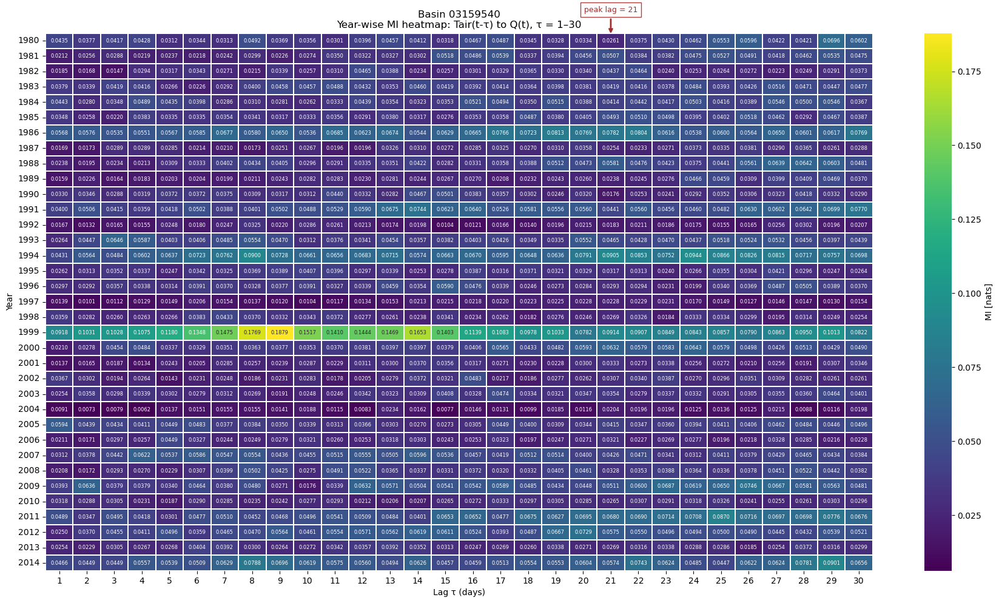

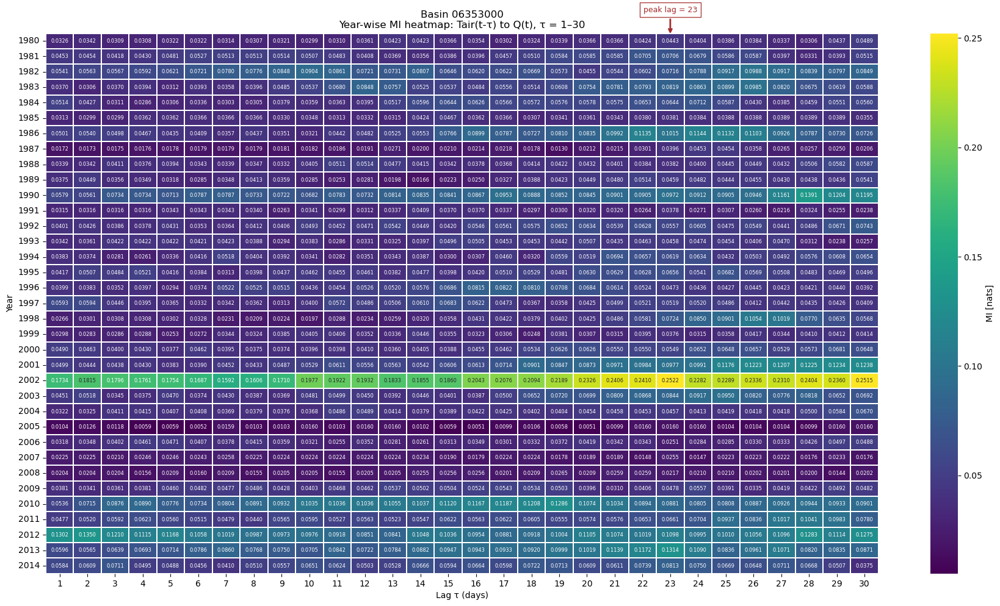

Saved: C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\MI_heatmap.pdf


In [23]:
from matplotlib.backends.backend_pdf import PdfPages

## Save year-wise lagged MI heatmaps for Tair and Q into one PDF

out_pdf = OUT_PDF / "MI_heatmap.pdf"

with PdfPages(str(out_pdf)) as pdf:

    tair_long_basins = selected_basins[
        selected_basins["expected_type"] == "Tair_longlag"
    ].copy()

    for _, row in tair_long_basins.iterrows():
        gauge_id = row["gauge_id"]
        peak_lag = int(row["peak_lag"])
        df = basin_data[gauge_id].copy()

        if "station_nm" in row.index:
            basin_name = row["station_nm"]
        elif "basin_name" in row.index:
            basin_name = row["basin_name"]
        else:
            basin_name = f"Basin {gauge_id}"

        mi_df, mi_pivot, _ = build_year_lag_mi_table(
            df=df,
            source_col="Tair",
            target_col="Q",
            max_lag=30,
            bins=5,
            base=np.e
        )

        fig, ax = plt.subplots(figsize=(18, 10))

        sns.heatmap(
            mi_pivot,
            cmap="viridis",
            annot=True,
            fmt=".4f",
            annot_kws={"size": 6},
            linewidths=0.3,
            linecolor="white",
            cbar_kws={"label": "MI [nats]"},
            ax=ax
        )

        x_peak = peak_lag - 0.5

        ax.annotate(
            f"peak lag = {peak_lag}",
            xy=(x_peak, 0.15),
            xytext=(x_peak, -1.25),
            textcoords="data",
            ha="center",
            va="bottom",
            color="brown",
            fontsize=9,
            bbox=dict(facecolor="white", alpha=0.9, edgecolor="brown"),
            arrowprops=dict(
                arrowstyle="->",
                color="brown",
                lw=2
            ),
            annotation_clip=False
        )

        ax.set_title(f"{basin_name}\nYear-wise MI heatmap: Tair(t-τ) to Q(t), τ = 1–30")
        ax.set_xlabel("Lag τ (days)")
        ax.set_ylabel("Year")

        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight")
        plt.show()
        plt.close(fig)

print("Saved:", out_pdf)

### Interpretation

The year-wise MI heatmap shows how the strength of the lagged relationship between Tair and streamflow changes across both year and lag. The log(MI) heatmap is easier to compare because it spreads out very small MI values that are hard to distinguish in the regular MI heatmap. If higher values repeatedly appear around the TE peak lag across multiple years, that supports that the long-lag Tair influence is not coming from only one isolated year. If the strong values are concentrated only in a few years, then the long-lag behavior may be year-dependent rather than consistent across the full record.

## Plot MI and log(MI) heatmaps


These figures show the year-wise lagged dependence between Tair and streamflow for each Tair-dominant basin. The MI heatmap shows the original magnitude, while the log(MI) heatmap helps reveal smaller differences more clearly. Using a higher-contrast colormap improves visual separation between lower and higher values while still keeping the numerical annotations.

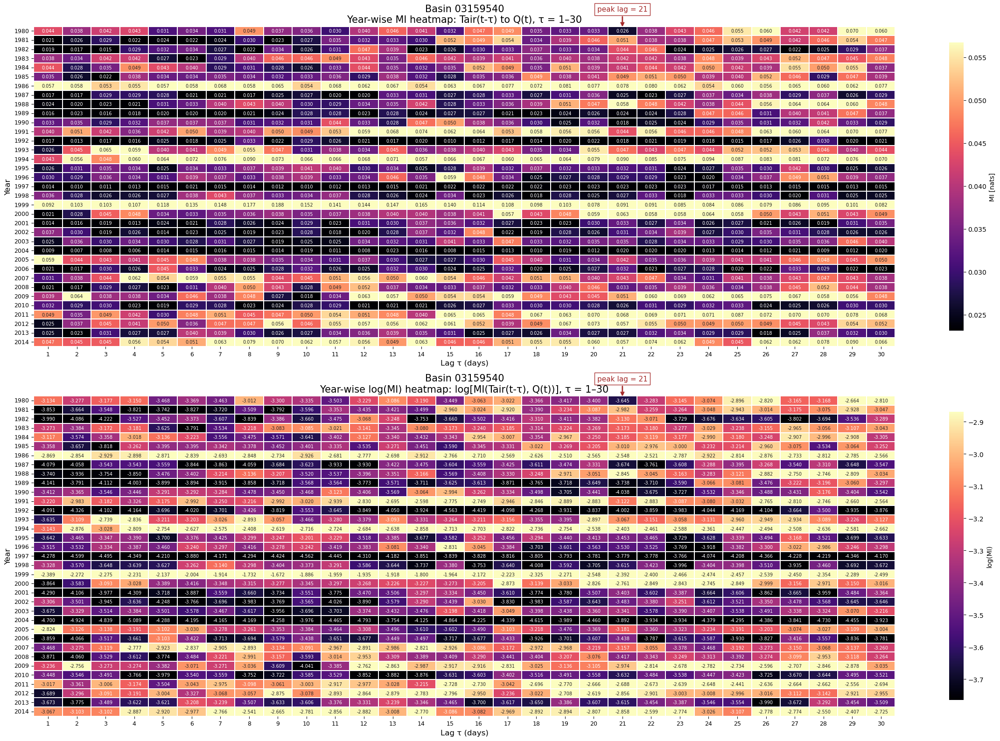

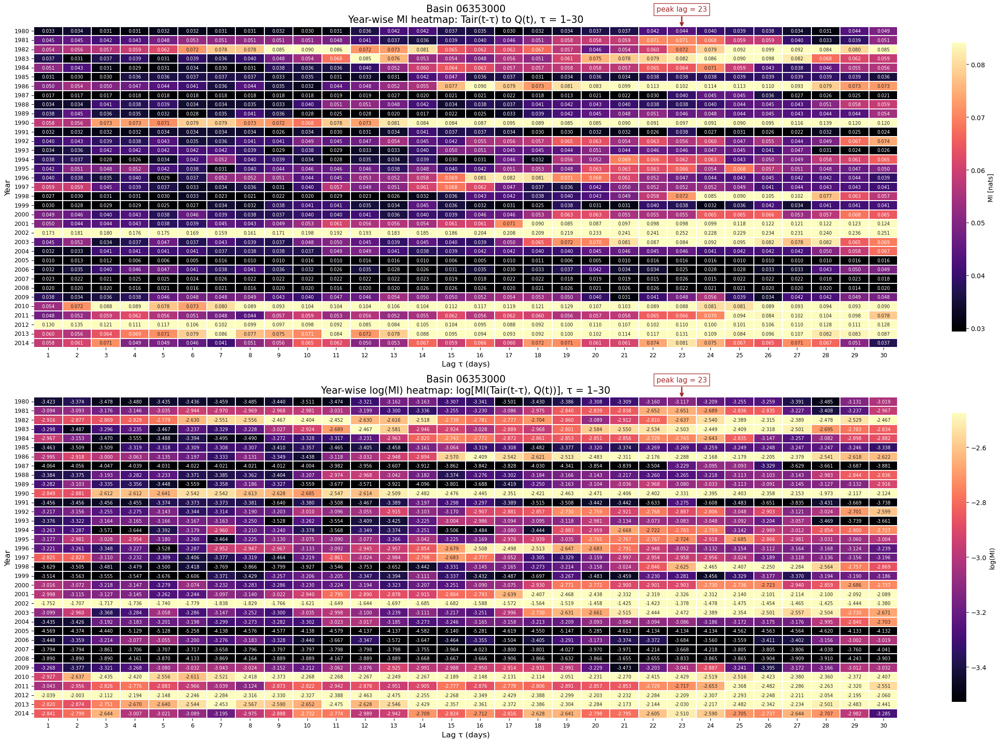

Saved: MI_LogMI_magma.pdf


In [24]:
from matplotlib.backends.backend_pdf import PdfPages

out_pdf = OUT_PDF / "MI_LogMI_magma.pdf"

tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

with PdfPages(str(out_pdf)) as pdf:
    for _, row in tair_long_basins.iterrows():
        gauge_id = row["gauge_id"]
        peak_lag = int(row["peak_lag"])
        df = basin_data[gauge_id].copy()

        if "station_nm" in row.index:
            basin_name = row["station_nm"]
        elif "basin_name" in row.index:
            basin_name = row["basin_name"]
        else:
            basin_name = f"Basin {gauge_id}"

        mi_df, mi_pivot, log_mi_pivot = build_year_lag_mi_table(
            df=df,
            source_col="Tair",
            target_col="Q",
            max_lag=30,
            bins=5,
            base=np.e
        )

        # basin-specific color scales
        mi_vals = mi_pivot.values.flatten()
        mi_vals = mi_vals[~np.isnan(mi_vals)]

        log_vals = log_mi_pivot.values.flatten()
        log_vals = log_vals[~np.isnan(log_vals)]

        mi_vmin = np.percentile(mi_vals, 15)
        mi_vmax = np.percentile(mi_vals, 85)

        logmi_vmin = np.percentile(log_vals, 15)
        logmi_vmax = np.percentile(log_vals, 85)

        x_peak = peak_lag - 0.5

        fig, axes = plt.subplots(2, 1, figsize=(24, 16), sharex=False)

        # Top: MI heatmap
        ax1 = axes[0]
        sns.heatmap(
            mi_pivot,
            cmap="magma",
            annot=True,
            fmt=".3f",
            annot_kws={"size": 7},
            linewidths=0.3,
            linecolor="white",
            cbar_kws={"label": "MI [nats]", "shrink": 0.9},
            vmin=mi_vmin,
            vmax=mi_vmax,
            ax=ax1
        )

        ax1.annotate(
            f"peak lag = {peak_lag}",
            xy=(x_peak, 0.2),
            xytext=(x_peak, -1.5),
            textcoords="data",
            ha="center",
            va="bottom",
            color="brown",
            fontsize=11,
            bbox=dict(facecolor="white", alpha=0.95, edgecolor="brown"),
            arrowprops=dict(arrowstyle="->", color="brown", lw=2),
            annotation_clip=False
        )

        ax1.set_title(
            f"{basin_name}\nYear-wise MI heatmap: Tair(t-τ) to Q(t), τ = 1–30",
            fontsize=15
        )
        ax1.set_xlabel("Lag τ (days)", fontsize=12)
        ax1.set_ylabel("Year", fontsize=12)
        ax1.tick_params(axis="x", labelsize=9)
        ax1.tick_params(axis="y", labelsize=9)

        # Bottom: log(MI) heatmap
        ax2 = axes[1]
        sns.heatmap(
            log_mi_pivot,
            cmap="magma",
            annot=True,
            fmt=".3f",
            annot_kws={"size": 7},
            linewidths=0.3,
            linecolor="white",
            cbar_kws={"label": "log(MI)", "shrink": 0.9},
            vmin=logmi_vmin,
            vmax=logmi_vmax,
            ax=ax2
        )

        ax2.annotate(
            f"peak lag = {peak_lag}",
            xy=(x_peak, 0.2),
            xytext=(x_peak, -1.5),
            textcoords="data",
            ha="center",
            va="bottom",
            color="brown",
            fontsize=11,
            bbox=dict(facecolor="white", alpha=0.95, edgecolor="brown"),
            arrowprops=dict(arrowstyle="->", color="brown", lw=2),
            annotation_clip=False
        )

        ax2.set_title(
            f"{basin_name}\nYear-wise log(MI) heatmap: log[MI(Tair(t-τ), Q(t))], τ = 1–30",
            fontsize=15
        )
        ax2.set_xlabel("Lag τ (days)", fontsize=12)
        ax2.set_ylabel("Year", fontsize=12)
        ax2.tick_params(axis="x", labelsize=9)
        ax2.tick_params(axis="y", labelsize=9)

        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight")
        plt.show()
        plt.close(fig)

print("Saved:", out_pdf.name)

## Plot year-wise log(MI) vs lag for the two Tair-long-lag basins

This cell plots one log(MI)–lag curve for each year, separately for the two Tair-long-lag basins, and marks the TE peak lag.

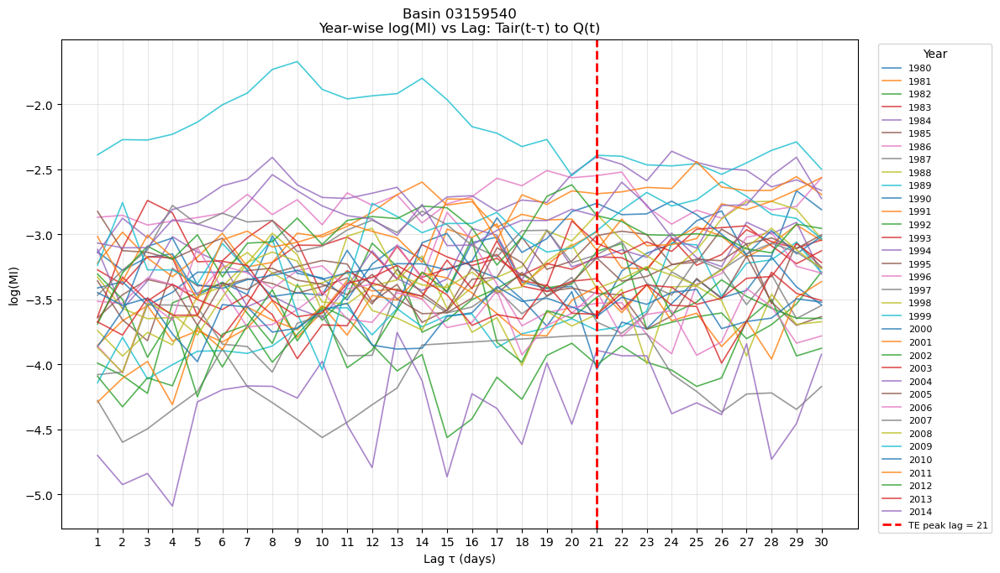

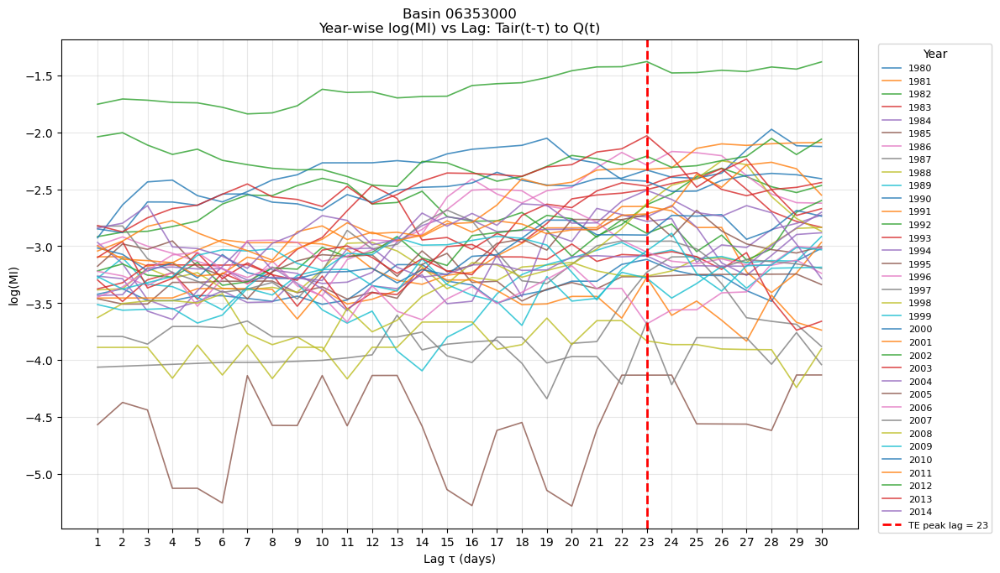

In [25]:
## Plot year-wise log(MI) vs lag for the two Tair-long-lag basins

tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

for _, row in tair_long_basins.iterrows():
    gauge_id = row["gauge_id"]
    peak_lag = int(row["peak_lag"])
    df = basin_data[gauge_id].copy()

    if "station_nm" in row.index:
        basin_name = row["station_nm"]
    elif "basin_name" in row.index:
        basin_name = row["basin_name"]
    else:
        basin_name = f"Basin {gauge_id}"

    mi_df, mi_pivot, log_mi_pivot = build_year_lag_mi_table(
        df=df,
        source_col="Tair",
        target_col="Q",
        max_lag=30,
        bins=5,
        base=np.e
    )

    lags = log_mi_pivot.columns.astype(int)

    plt.figure(figsize=(12, 7))

    for year in log_mi_pivot.index:
        yvals = log_mi_pivot.loc[year].values

        plt.plot(
            lags,
            yvals,
            linewidth=1.2,
            alpha=0.8,
            label=str(year)
        )

    plt.axvline(
        peak_lag,
        linestyle="--",
        linewidth=2,
        color="red",
        label=f"TE peak lag = {peak_lag}"
    )

    plt.xlabel("Lag τ (days)")
    plt.ylabel("log(MI)")
    plt.title(f"{basin_name}\nYear-wise log(MI) vs Lag: Tair(t-τ) to Q(t)")
    plt.xticks(range(1, 31))
    plt.grid(True, alpha=0.3)

    plt.legend(
        title="Year",
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        fontsize=8,
        ncol=1
    )

    plt.tight_layout()
    plt.show()

## Year-wise lagged correlation heatmap for Tair and Q

This cell computes year-wise Pearson correlation between Tair(t−τ) and Q(t) for τ = 1 to 30 and plots one heatmap for each Tair long-lag basin.

In [26]:
def build_year_lag_corr_table(df, source_col="Tair", target_col="Q", max_lag=30):
    df = df.copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.sort_values("Date").reset_index(drop=True)

    df[source_col] = pd.to_numeric(df[source_col], errors="coerce")
    df[target_col] = pd.to_numeric(df[target_col], errors="coerce")
    df.loc[df[target_col] < 0, target_col] = np.nan
    df["Year"] = df["Date"].dt.year

    records = []

    for year in sorted(df["Year"].dropna().unique()):
        year_df = df[df["Year"] == year].copy().reset_index(drop=True)

        xdata = year_df[source_col].values
        ydata = year_df[target_col].values

        for lag in range(1, max_lag + 1):
            corr_val = corr_lag(
                xdata=xdata,
                ydata=ydata,
                lag=lag
            )

            records.append({
                "Year": int(year),
                "Lag": lag,
                "Correlation": corr_val
            })

    corr_df = pd.DataFrame(records)
    corr_pivot = corr_df.pivot(index="Year", columns="Lag", values="Correlation")

    return corr_df, corr_pivot

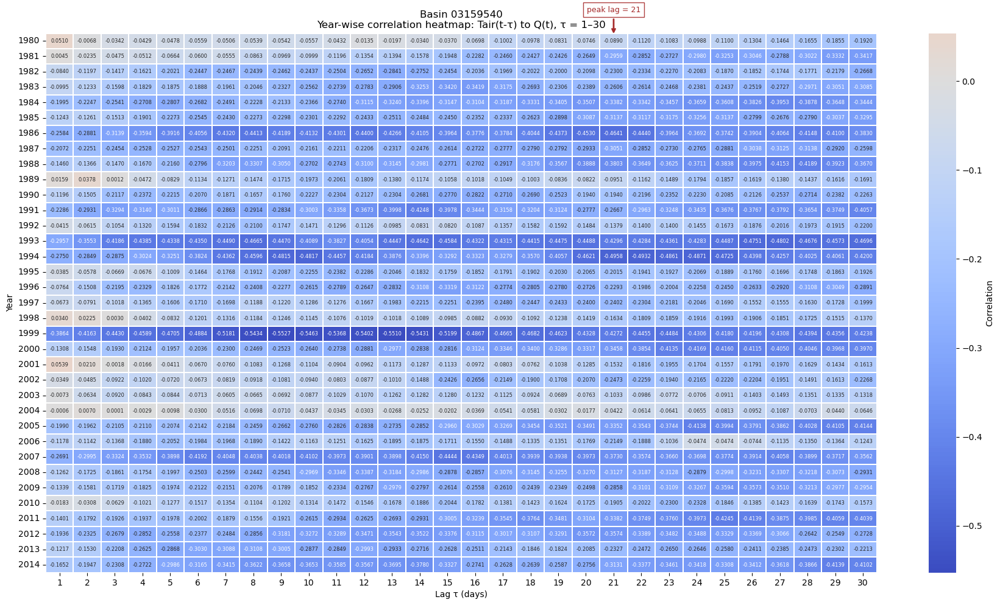

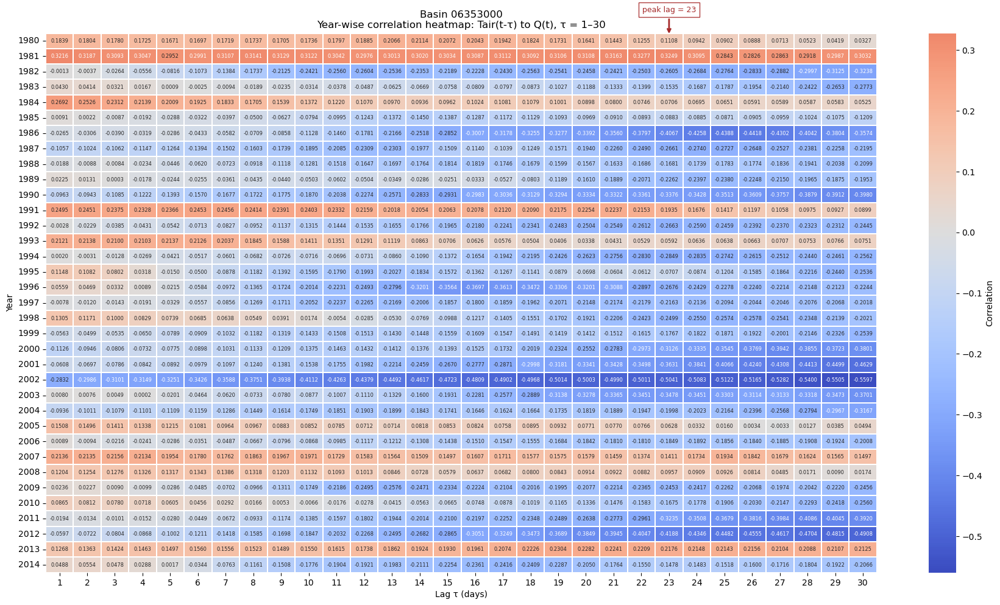

Saved: Tair_Q_corr.pdf


In [27]:
from matplotlib.backends.backend_pdf import PdfPages

## Save and show year-wise lagged correlation heatmaps for Tair and Q

out_pdf = OUT_PDF / "Tair_Q_corr.pdf"

tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

with PdfPages(str(out_pdf)) as pdf:
    for _, row in tair_long_basins.iterrows():
        gauge_id = row["gauge_id"]
        peak_lag = int(row["peak_lag"])
        df = basin_data[gauge_id].copy()

        if "station_nm" in row.index:
            basin_name = row["station_nm"]
        elif "basin_name" in row.index:
            basin_name = row["basin_name"]
        else:
            basin_name = f"Basin {gauge_id}"

        corr_df, corr_pivot = build_year_lag_corr_table(
            df=df,
            source_col="Tair",
            target_col="Q",
            max_lag=30
        )

        fig, ax = plt.subplots(figsize=(18, 10))

        sns.heatmap(
            corr_pivot,
            cmap="coolwarm",
            center=0,
            annot=True,
            fmt=".4f",
            annot_kws={"size": 6},
            linewidths=0.3,
            linecolor="white",
            cbar_kws={"label": "Correlation"},
            ax=ax
        )

        x_peak = peak_lag - 0.5

        ax.annotate(
            f"peak lag = {peak_lag}",
            xy=(x_peak, 0.15),
            xytext=(x_peak, -1.25),
            textcoords="data",
            ha="center",
            va="bottom",
            color="brown",
            fontsize=9,
            bbox=dict(facecolor="white", alpha=0.9, edgecolor="brown"),
            arrowprops=dict(
                arrowstyle="->",
                color="brown",
                lw=2
            ),
            annotation_clip=False
        )

        ax.set_title(f"{basin_name}\nYear-wise correlation heatmap: Tair(t-τ) to Q(t), τ = 1–30")
        ax.set_xlabel("Lag τ (days)")
        ax.set_ylabel("Year")

        plt.tight_layout()

        pdf.savefig(fig, bbox_inches="tight")
        plt.show()
        plt.close(fig)

print("Saved:", out_pdf.name)

## Plot year-wise correlation vs lag for the two Tair-long-lag basins

This cell plots one correlation–lag curve for each year, separately for the two Tair-long-lag basins, and marks the TE peak lag.

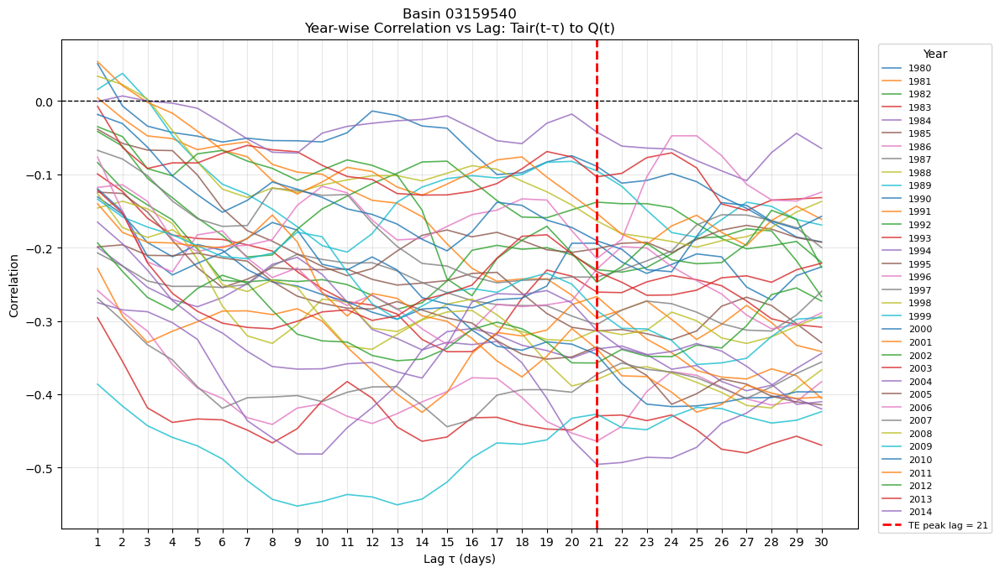

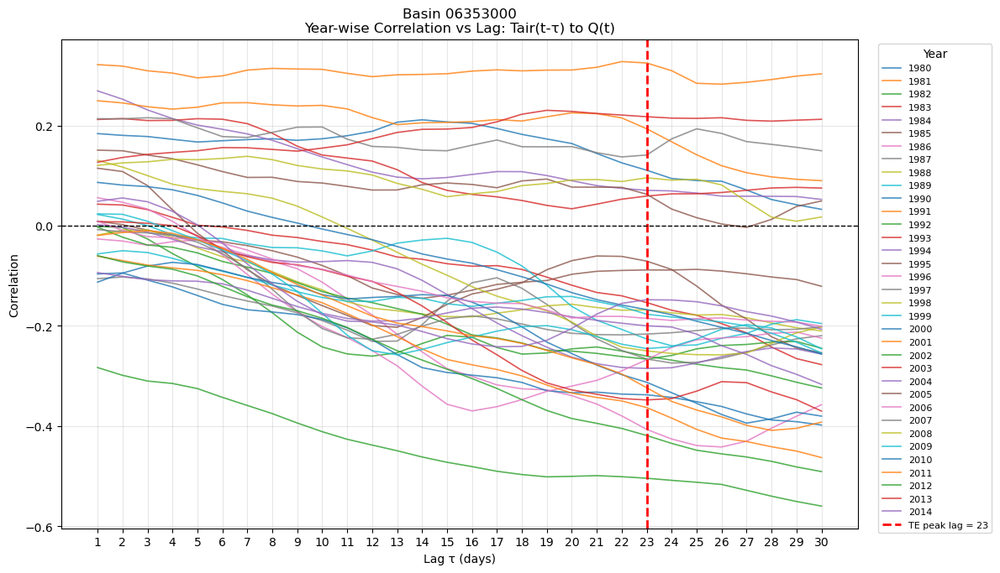

In [28]:
# Plot Year-wise Correlation vs Lag
# one figure per basin

tair_long_basins = selected_basins[
    selected_basins["expected_type"] == "Tair_longlag"
].copy()

for _, row in tair_long_basins.iterrows():
    gauge_id = row["gauge_id"]
    peak_lag = int(row["peak_lag"])
    df = basin_data[gauge_id].copy()

    if "station_nm" in row.index:
        basin_name = row["station_nm"]
    elif "basin_name" in row.index:
        basin_name = row["basin_name"]
    else:
        basin_name = f"Basin {gauge_id}"

    corr_df, corr_pivot = build_year_lag_corr_table(
        df=df,
        source_col="Tair",
        target_col="Q",
        max_lag=30
    )

    lags = corr_pivot.columns.astype(int)

    plt.figure(figsize=(12, 7))

    for year in corr_pivot.index:
        yvals = corr_pivot.loc[year].values

        plt.plot(
            lags,
            yvals,
            linewidth=1.2,
            alpha=0.8,
            label=str(year)
        )

    plt.axvline(
        peak_lag,
        linestyle="--",
        linewidth=2,
        color="red",
        label=f"TE peak lag = {peak_lag}"
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1,
        color="black"
    )

    plt.xlabel("Lag τ (days)")
    plt.ylabel("Correlation")
    plt.title(f"{basin_name}\nYear-wise Correlation vs Lag: Tair(t-τ) to Q(t)")
    plt.xticks(range(1, 31))
    plt.grid(True, alpha=0.3)

    plt.legend(
        title="Year",
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
        fontsize=8,
        ncol=1
    )

    plt.tight_layout()
    plt.show()

# Make 8 CONUS plots for dominant-forcing groups

This code loads the basin-wise TE summary and gauge locations, then makes:

- 4 CONUS TE plots:
  - PRCP-dominant basins
  - SRAD-dominant basins
  - Tair-dominant basins
  - VP-dominant basins

- 4 CONUS lag plots:
  - PRCP-dominant basins
  - SRAD-dominant basins
  - Tair-dominant basins
  - VP-dominant basins

All 8 plots are saved into one PDF.

## Load TE summary and merge correct basin coordinates

This step loads the TE summary file and extracts the correct gauge ID, latitude, and longitude from the shifted gauge-information table.

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Paths
PROJECT_DIR = Path.cwd()
OUT_PDF = PROJECT_DIR / "outputs" / "pdf"
OUT_PDF.mkdir(parents=True, exist_ok=True)

te_summary_path = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\TE basin to basin analysis\outputs\summary_csv\te_summary_main_671basins.csv"
)

gauge_info_path = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\basin_timeseries_v1p2_metForcing_obsFlow\basin_dataset_public_v1p2\basin_metadata\gauge_information.txt"
)

print("PROJECT_DIR:", PROJECT_DIR)
print("OUT_PDF:", OUT_PDF)
print("te_summary_path exists:", te_summary_path.exists())
print("gauge_info_path exists:", gauge_info_path.exists())

# Load TE summary
te_df = pd.read_csv(te_summary_path)
te_df["gauge_id"] = te_df["gauge_id"].astype(str).str.zfill(8)

print("\nTE summary shape:", te_df.shape)
print("TE summary columns:")
print(te_df.columns.tolist())

display(te_df.head())

# Load gauge information
gauge_raw = pd.read_csv(gauge_info_path, sep="\t", engine="python")

print("\nGauge raw shape:", gauge_raw.shape)
print("Gauge raw columns:")
print(gauge_raw.columns.tolist())

display(gauge_raw.head())

# 4) Extract correct columns from shifted table
gauge_df = pd.DataFrame()

# shifted columns from your file preview
gauge_df["gauge_id"] = gauge_raw["Unnamed: 1"].astype(str).str.strip().str.zfill(8)
gauge_df["gauge_lat"] = pd.to_numeric(gauge_raw["GAGE_NAME"], errors="coerce")
gauge_df["gauge_lon"] = pd.to_numeric(gauge_raw["Unnamed: 4"], errors="coerce")

print("\nCleaned gauge_df shape:", gauge_df.shape)
print("Missing gauge_id:", gauge_df["gauge_id"].isna().sum())
print("Missing lat/lon rows:", gauge_df[["gauge_lat", "gauge_lon"]].isna().any(axis=1).sum())

display(gauge_df.head())

# Merge
plot_df = te_df.merge(gauge_df, on="gauge_id", how="left")

print("\nMerged shape:", plot_df.shape)
print("Missing lat/lon after merge:", plot_df[["gauge_lat", "gauge_lon"]].isna().any(axis=1).sum())

display(plot_df.head())

PROJECT_DIR: c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins
OUT_PDF: c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf
te_summary_path exists: True
gauge_info_path exists: True

TE summary shape: (671, 8)
TE summary columns:
['gauge_id', 'dominant_forcing', 'peak_lag', 'peak_TE', 'PRCP', 'SRAD', 'Tair', 'VP']


,gauge_id,dominant_forcing,peak_lag,peak_TE,PRCP,SRAD,Tair,VP
0,01013500,Tair,14,0.004888,0.002761,0.003063,0.004888,0.002685
1,01022500,PRCP,1,0.016681,0.016681,0.004775,0.008300,0.006192
2,01030500,PRCP,1,0.013428,0.013428,0.004072,0.007460,0.005949
3,01031500,PRCP,1,0.003859,0.003859,0.001481,0.001351,0.001597
4,01047000,PRCP,1,0.002277,0.002277,0.001389,0.001541,0.001330



Gauge raw shape: (671, 13)
Gauge raw columns:
['HUC_02  GAGE_ID', 'Unnamed: 1', 'Unnamed: 2', 'GAGE_NAME', 'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'LAT', 'Unnamed: 9', 'LONG', 'Unnamed: 11', 'DRAINAGE AREA (KM^2)']


,HUC_02 GAGE_ID,Unnamed: 1,Unnamed: 2,GAGE_NAME,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,LAT,Unnamed: 9,LONG,Unnamed: 11,DRAINAGE AREA (KM^2)
0,1,1013500,"Fish River near Fort Kent, M...",47.23739,-68.58264,2252.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1022500,"Narraguagus River at Cherryfield, M...",44.60797,-67.93524,573.60,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,1030500,"Mattawamkeag River near Mattawamkeag, M...",45.50097,-68.30596,3676.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,1031500,"Piscataquis River near Dover-Foxcroft, M...",45.17501,-69.31470,769.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,1047000,"Carrabassett River near North Anson, M...",44.86920,-69.95510,909.10,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Cleaned gauge_df shape: (671, 3)
Missing gauge_id: 0
Missing lat/lon rows: 0


,gauge_id,gauge_lat,gauge_lon
0,01013500,47.23739,-68.58264
1,01022500,44.60797,-67.93524
2,01030500,45.50097,-68.30596
3,01031500,45.17501,-69.31470
4,01047000,44.86920,-69.95510



Merged shape: (671, 10)
Missing lat/lon after merge: 0


,gauge_id,dominant_forcing,peak_lag,peak_TE,PRCP,SRAD,Tair,VP,gauge_lat,gauge_lon
0,01013500,Tair,14,0.004888,0.002761,0.003063,0.004888,0.002685,47.23739,-68.58264
1,01022500,PRCP,1,0.016681,0.016681,0.004775,0.008300,0.006192,44.60797,-67.93524
2,01030500,PRCP,1,0.013428,0.013428,0.004072,0.007460,0.005949,45.50097,-68.30596
3,01031500,PRCP,1,0.003859,0.003859,0.001481,0.001351,0.001597,45.17501,-69.31470
4,01047000,PRCP,1,0.002277,0.002277,0.001389,0.001541,0.001330,44.86920,-69.95510


## CONUS maps of dominant basins by forcing

This step plots only the basins that are dominant for each forcing:

- PRCP-dominant
- SRAD-dominant
- Tair-dominant
- VP-dominant

Point color shows the forcing-specific TE value using discrete classes.
The figure is saved as both PNG and PDF.

C:\Users\ppaudel2\AppData\Local\Temp\ipykernel_1708\4089275036.py:120: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = get_cmap("plasma", len(bounds) - 1)
C:\Users\ppaudel2\AppData\Local\Temp\ipykernel_1708\4089275036.py:120: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = get_cmap("plasma", len(bounds) - 1)
C:\Users\ppaudel2\AppData\Local\Temp\ipykernel_1708\4089275036.py:120: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = get_cma

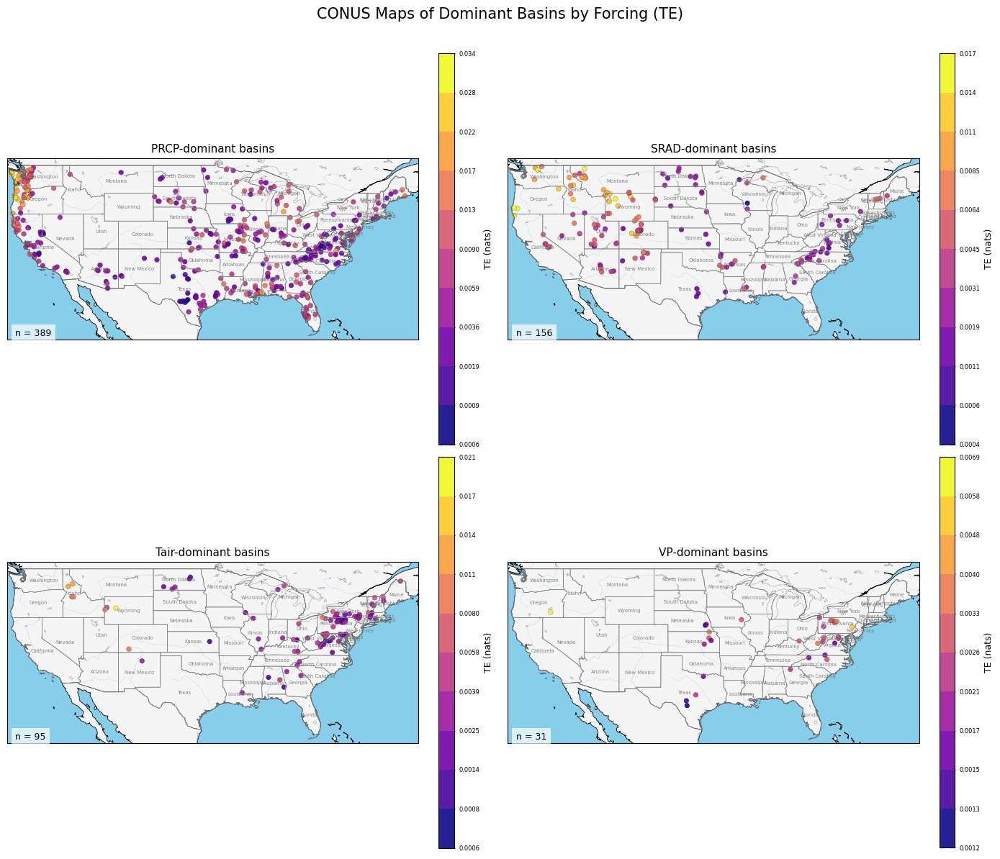

c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_map_TE.png
c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_map_TE.pdf


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.cm import get_cmap

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

# Output folder
PROJECT_DIR = Path.cwd()
OUT_PDF = PROJECT_DIR / "outputs" / "pdf"
OUT_PDF.mkdir(parents=True, exist_ok=True)

dominant_conus_pdf = OUT_PDF / "CONUS_map_TE.pdf"
dominant_conus_png = OUT_PDF / "CONUS_map_TE.png"

# 2) Use one row per basin
#    plot_df must already exist from previous step
dom_map_df = plot_df.drop_duplicates(subset="gauge_id").copy()

# Fix longitude if stored as positive west values
dom_map_df["gauge_lon_plot"] = dom_map_df["gauge_lon"].copy()
if dom_map_df["gauge_lon_plot"].mean() > 0:
    dom_map_df["gauge_lon_plot"] = -dom_map_df["gauge_lon_plot"]

# Forcing list
forcings = ["PRCP", "SRAD", "Tair", "VP"]

# Read US states shapefile
states_shp = shpreader.natural_earth(
    resolution="50m",
    category="cultural",
    name="admin_1_states_provinces"
)
states_reader = shpreader.Reader(states_shp)
state_records = list(states_reader.records())

exclude_names = {
    "Alaska", "Hawaii", "Puerto Rico",
    "American Samoa", "Guam", "Northern Mariana Islands",
    "United States Virgin Islands", "District of Columbia"
}

conus_states = []
for rec in state_records:
    attrs = rec.attributes
    admin = attrs.get("admin")
    name = attrs.get("name")
    if admin == "United States of America" and name not in exclude_names:
        conus_states.append(rec)

# 4) Function to build 10 class boundaries
#    more sensitive at very small TE values
def make_small_sensitive_bounds(values):
    x = pd.Series(values).dropna().astype(float)
    x = x[x >= 0]

    if len(x) == 0:
        return [0.0000, 0.0002, 0.0004, 0.0006, 0.0008,
                0.0010, 0.0015, 0.0025, 0.0040, 0.0060, 0.0080]

    te_min = float(x.min())
    te_max = float(x.max())

    if te_max <= te_min:
        te_max = te_min + 1e-6

    # 11 boundaries = 10 classes
    # square spacing gives tighter boundaries near TEmin
    s = np.linspace(0, 1, 11) ** 2
    bounds = te_min + (te_max - te_min) * s
    bounds = np.round(bounds, 6)

    bounds = np.unique(bounds)

    if len(bounds) < 11:
        bounds = np.linspace(te_min, te_max, 11)
        bounds = np.round(bounds, 6)

    return list(bounds)

# 5) Tick label formatter
def fmt_tick(x):
    if x < 0.01:
        return f"{x:.4f}"
    return f"{x:.3f}"

# Make figure
fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 12),
    subplot_kw={"projection": ccrs.PlateCarree()}
)
axes = axes.flatten()

for ax, forcing in zip(axes, forcings):
    te_col = forcing
    sub = dom_map_df[dom_map_df["dominant_forcing"] == forcing].copy()

    # separate bounds for this forcing
    bounds = make_small_sensitive_bounds(sub[te_col])

    # Use stronger color pattern
    base_cmap = get_cmap("plasma", len(bounds) - 1)
    cmap = ListedColormap(base_cmap(np.arange(len(bounds) - 1)))
    norm = BoundaryNorm(bounds, cmap.N)

    # Map extent
    ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())

    # Background
    ax.add_feature(cfeature.LAND, facecolor="whitesmoke")
    ax.add_feature(cfeature.OCEAN, facecolor="skyblue")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAKES, edgecolor="gray", facecolor="none", linewidth=0.3)
    ax.add_feature(cfeature.RIVERS, edgecolor="lightblue", linewidth=0.3)

    # State borders
    for rec in conus_states:
        ax.add_geometries(
            [rec.geometry],
            crs=ccrs.PlateCarree(),
            facecolor="none",
            edgecolor="gray",
            linewidth=0.5
        )

    # State names
    for rec in conus_states:
        geom = rec.geometry
        pt = geom.representative_point()
        state_name = rec.attributes.get("name", "")
        ax.text(
            pt.x, pt.y, state_name,
            transform=ccrs.PlateCarree(),
            fontsize=5,
            color="dimgray",
            ha="center",
            va="center",
            alpha=0.8
        )

    # Plot only dominant basins for this forcing
    sc = ax.scatter(
        sub["gauge_lon_plot"],
        sub["gauge_lat"],
        c=sub[te_col],
        cmap=cmap,
        norm=norm,
        s=24,
        edgecolors="black",
        linewidths=0.15,
        alpha=0.9,
        transform=ccrs.PlateCarree()
    )

    ax.set_title(f"{forcing}-dominant basins", fontsize=11)

    # Show all boundaries, but give equal height to each class
    cbar = plt.colorbar(
        sc,
        ax=ax,
        shrink=1.08,
        pad=0.045,
        fraction=0.035,
        aspect=25,
        boundaries=bounds,
        ticks=bounds,
        spacing="uniform"
    )
    cbar.set_label("TE (nats)", fontsize=9)
    cbar.ax.tick_params(labelsize=6, length=1)
    cbar.ax.set_yticklabels([fmt_tick(x) for x in bounds])

    # Count text
    ax.text(
        0.02, 0.02,
        f"n = {len(sub)}",
        transform=ax.transAxes,
        fontsize=9,
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
    )

fig.suptitle("CONUS Maps of Dominant Basins by Forcing (TE)", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96], h_pad=2.5, w_pad=1.5)

# Save PNG
fig.savefig(dominant_conus_png, dpi=300, bbox_inches="tight")

# Save PDF
with PdfPages(dominant_conus_pdf) as pdf:
    pdf.savefig(fig, bbox_inches="tight")

plt.show()
plt.close(fig)

print(dominant_conus_png)
print(dominant_conus_pdf)

## CONUS maps of dominant basins by forcing for peak TE lag

This step plots dominant basins for each forcing.
The point color shows `peak_lag` using custom lag boundaries and clearly separated discrete colors.

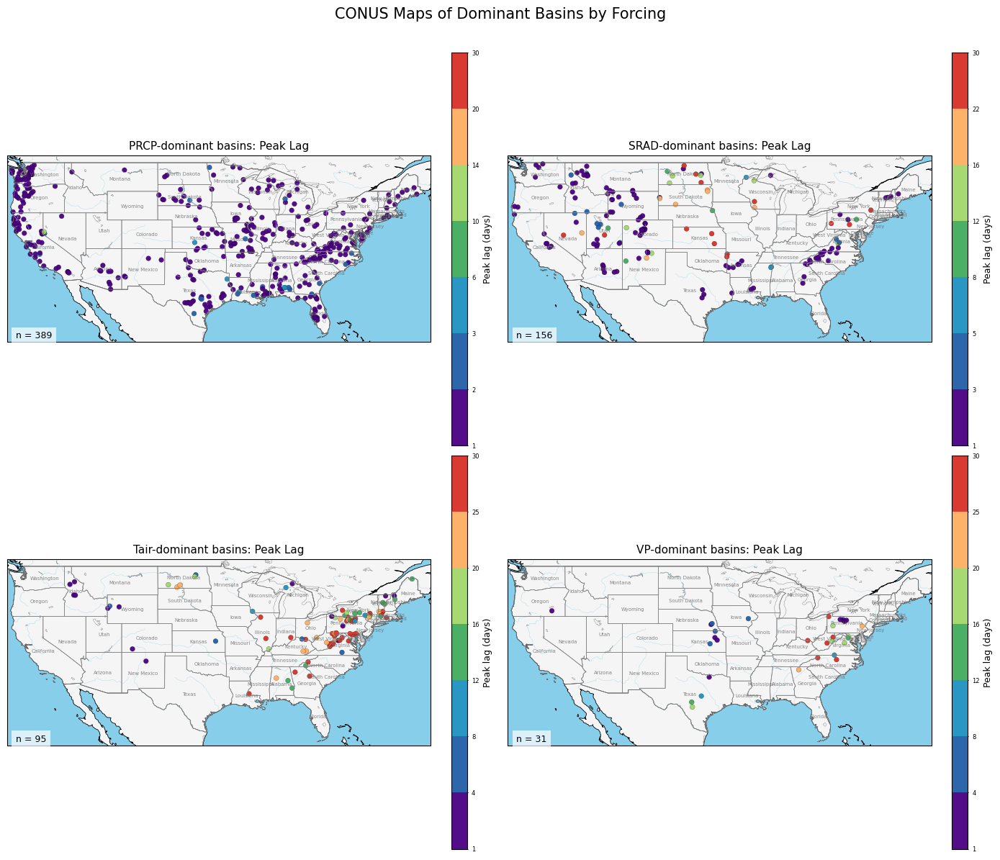

c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_map_peak_lag.png
c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_map_peak_lag.pdf


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import BoundaryNorm, ListedColormap

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

# Output folder
PROJECT_DIR = Path.cwd()
OUT_PDF = PROJECT_DIR / "outputs" / "pdf"
OUT_PDF.mkdir(parents=True, exist_ok=True)

dominant_lag_pdf = OUT_PDF / "CONUS_map_peak_lag.pdf"
dominant_lag_png = OUT_PDF / "CONUS_map_peak_lag.png"

# Use one row per basin
dom_map_df = plot_df.drop_duplicates(subset="gauge_id").copy()

# Fix longitude if stored as positive west values
dom_map_df["gauge_lon_plot"] = dom_map_df["gauge_lon"].copy()
if dom_map_df["gauge_lon_plot"].mean() > 0:
    dom_map_df["gauge_lon_plot"] = -dom_map_df["gauge_lon_plot"]

# Forcing list
forcings = ["PRCP", "SRAD", "Tair", "VP"]

# Custom lag boundaries for each forcing
lag_bounds_dict = {
    "PRCP": [1, 2, 3, 6, 10, 14, 20, 30],
    "SRAD": [1, 3, 5, 8, 12, 16, 22, 30],
    "Tair": [1, 4, 8, 12, 16, 20, 25, 30],
    "VP":   [1, 4, 8, 12, 16, 20, 25, 30],
}

# 4) Strongly separated lag colors
#    7 classes because each forcing has 8 boundaries
lag_colors = [
    "#4b0082",  # indigo
    "#225ea8",  # blue
    "#1d91c0",  # light blue
    "#41ab5d",  # green
    "#a1d76a",  # yellow-green
    "#fdae61",  # orange
    "#d73027",  # red
]
lag_cmap = ListedColormap(lag_colors)

# Read US states shapefile
states_shp = shpreader.natural_earth(
    resolution="50m",
    category="cultural",
    name="admin_1_states_provinces"
)
states_reader = shpreader.Reader(states_shp)
state_records = list(states_reader.records())

exclude_names = {
    "Alaska", "Hawaii", "Puerto Rico",
    "American Samoa", "Guam", "Northern Mariana Islands",
    "United States Virgin Islands", "District of Columbia"
}

conus_states = []
for rec in state_records:
    attrs = rec.attributes
    admin = attrs.get("admin")
    name = attrs.get("name")
    if admin == "United States of America" and name not in exclude_names:
        conus_states.append(rec)

# Make figure
fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 12),
    subplot_kw={"projection": ccrs.PlateCarree()}
)
axes = axes.flatten()

for ax, forcing in zip(axes, forcings):
    sub = dom_map_df[dom_map_df["dominant_forcing"] == forcing].copy()

    bounds = lag_bounds_dict[forcing]
    norm = BoundaryNorm(bounds, lag_cmap.N)

    # Map extent
    ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())

    # Background
    ax.add_feature(cfeature.LAND, facecolor="whitesmoke")
    ax.add_feature(cfeature.OCEAN, facecolor="skyblue")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAKES, edgecolor="gray", facecolor="none", linewidth=0.3)
    ax.add_feature(cfeature.RIVERS, edgecolor="lightblue", linewidth=0.3)

    # State borders
    for rec in conus_states:
        ax.add_geometries(
            [rec.geometry],
            crs=ccrs.PlateCarree(),
            facecolor="none",
            edgecolor="gray",
            linewidth=0.5
        )

    # State names
    for rec in conus_states:
        geom = rec.geometry
        pt = geom.representative_point()
        state_name = rec.attributes.get("name", "")
        ax.text(
            pt.x, pt.y, state_name,
            transform=ccrs.PlateCarree(),
            fontsize=5,
            color="dimgray",
            ha="center",
            va="center",
            alpha=0.8
        )

    # Plot dominant basins only
    sc = ax.scatter(
        sub["gauge_lon_plot"],
        sub["gauge_lat"],
        c=sub["peak_lag"],
        cmap=lag_cmap,
        norm=norm,
        s=24,
        edgecolors="black",
        linewidths=0.15,
        alpha=0.95,
        transform=ccrs.PlateCarree()
    )

    ax.set_title(f"{forcing}-dominant basins: Peak Lag", fontsize=11)

    cbar = plt.colorbar(
        sc,
        ax=ax,
        shrink=1.08,
        pad=0.045,
        fraction=0.035,
        aspect=25,
        boundaries=bounds,
        ticks=bounds,
        spacing="uniform"
    )
    cbar.set_label("Peak lag (days)", fontsize=9)
    cbar.ax.tick_params(labelsize=6, length=1)

    # Count text
    ax.text(
        0.02, 0.02,
        f"n = {len(sub)}",
        transform=ax.transAxes,
        fontsize=9,
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
    )

fig.suptitle("CONUS Maps of Dominant Basins by Forcing", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96], h_pad=2.5, w_pad=1.5)

# Save PNG
fig.savefig(dominant_lag_png, dpi=300, bbox_inches="tight")

# Save PDF
with PdfPages(dominant_lag_pdf) as pdf:
    pdf.savefig(fig, bbox_inches="tight")

plt.show()
plt.close(fig)

print(dominant_lag_png)
print(dominant_lag_pdf)

## Load watershed area and basin locations

In this step, we load watershed area and merge it with basin latitude and longitude for all CAMELS basins.

In [ ]:
# File paths
gauge_info_path = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\basin_timeseries_v1p2_metForcing_obsFlow\basin_dataset_public_v1p2\basin_metadata\gauge_information.txt"
)

basin_physical_path = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\basin_timeseries_v1p2_metForcing_obsFlow\basin_dataset_public_v1p2\basin_metadata\basin_physical_characteristics.txt"
)

print("gauge_info_path exists:", gauge_info_path.exists())
print("basin_physical_path exists:", basin_physical_path.exists())

# Read gauge information
#    (same shifted-column method we already used)
gauge_raw = pd.read_csv(gauge_info_path, sep="\t", engine="python")

gauge_df = pd.DataFrame()
gauge_df["gauge_id"] = gauge_raw["Unnamed: 1"].astype(str).str.strip().str.zfill(8)
gauge_df["gauge_lat"] = pd.to_numeric(gauge_raw["GAGE_NAME"], errors="coerce")
gauge_df["gauge_lon"] = pd.to_numeric(gauge_raw["Unnamed: 4"], errors="coerce")

# 3) Read basin physical characteristics
phys_df = pd.read_csv(
    basin_physical_path,
    sep=r"\s+",
    engine="python",
    dtype={"BASIN_ID": str}
)

phys_df["gauge_id"] = phys_df["BASIN_ID"].astype(str).str.zfill(8)

# watershed area column in this file is Size(km2)
phys_df = phys_df.rename(columns={"Size(km2)": "watershed_area_km2"})

phys_df = phys_df[["gauge_id", "watershed_area_km2"]].copy()

# Merge
area_df = gauge_df.merge(phys_df, on="gauge_id", how="inner")

# fix longitude if stored positive
area_df["gauge_lon_plot"] = area_df["gauge_lon"].copy()
if area_df["gauge_lon_plot"].mean() > 0:
    area_df["gauge_lon_plot"] = -area_df["gauge_lon_plot"]

print("Merged shape:", area_df.shape)
print("Missing rows:", area_df[["gauge_lat", "gauge_lon_plot", "watershed_area_km2"]].isna().any(axis=1).sum())

display(area_df.head())

gauge_info_path exists: True
basin_physical_path exists: True
Merged shape: (671, 5)
Missing rows: 0


,gauge_id,gauge_lat,gauge_lon,watershed_area_km2,gauge_lon_plot
0,01013500,47.23739,-68.58264,2303.95,-68.58264
1,01022500,44.60797,-67.93524,620.38,-67.93524
2,01030500,45.50097,-68.30596,3676.09,-68.30596
3,01031500,45.17501,-69.31470,766.53,-69.31470
4,01047000,44.86920,-69.95510,904.94,-69.95510


## Plot CONUS map of watershed area

In this step, we plot all 671 CAMELS basins on a CONUS map.
Point color shows watershed area in km².

C:\Users\ppaudel2\AppData\Local\Temp\ipykernel_1708\2399992812.py:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = get_cmap("plasma", len(bounds) - 1)


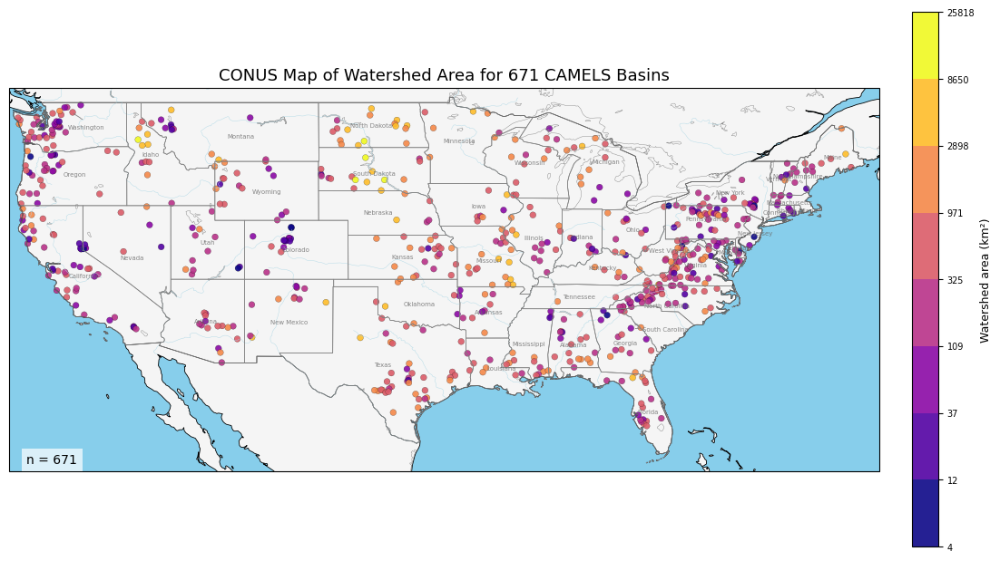

c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_watershed_area.png
c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\CONUS_watershed_area.pdf


In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.cm import get_cmap

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

# Output paths
OUT_PDF = Path.cwd() / "outputs" / "pdf"
OUT_PDF.mkdir(parents=True, exist_ok=True)

area_png = OUT_PDF / "CONUS_watershed_area.png"
area_pdf = OUT_PDF / "CONUS_watershed_area.pdf"

# Read US states shapefile
states_shp = shpreader.natural_earth(
    resolution="50m",
    category="cultural",
    name="admin_1_states_provinces"
)
states_reader = shpreader.Reader(states_shp)
state_records = list(states_reader.records())

exclude_names = {
    "Alaska", "Hawaii", "Puerto Rico",
    "American Samoa", "Guam", "Northern Mariana Islands",
    "United States Virgin Islands", "District of Columbia"
}

conus_states = []
for rec in state_records:
    attrs = rec.attributes
    admin = attrs.get("admin")
    name = attrs.get("name")
    if admin == "United States of America" and name not in exclude_names:
        conus_states.append(rec)

# Build watershed-area classes
x = area_df["watershed_area_km2"].dropna().astype(float)

area_min = float(x.min())
area_max = float(x.max())

bounds = np.geomspace(area_min, area_max, 9)   # 8 classes
bounds = np.round(bounds, 2)

base_cmap = get_cmap("plasma", len(bounds) - 1)
cmap = ListedColormap(base_cmap(np.arange(len(bounds) - 1)))
norm = BoundaryNorm(bounds, cmap.N)

# 4) Make figure
fig = plt.figure(figsize=(12, 7))
ax = plt.axes(projection=ccrs.PlateCarree())

# Map extent
ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())

# Background
ax.add_feature(cfeature.LAND, facecolor="whitesmoke")
ax.add_feature(cfeature.OCEAN, facecolor="skyblue")
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, edgecolor="gray", facecolor="none", linewidth=0.3)
ax.add_feature(cfeature.RIVERS, edgecolor="lightblue", linewidth=0.3)

# State borders
for rec in conus_states:
    ax.add_geometries(
        [rec.geometry],
        crs=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor="gray",
        linewidth=0.5
    )

# State names
for rec in conus_states:
    geom = rec.geometry
    pt = geom.representative_point()
    state_name = rec.attributes.get("name", "")
    ax.text(
        pt.x, pt.y, state_name,
        transform=ccrs.PlateCarree(),
        fontsize=5,
        color="dimgray",
        ha="center",
        va="center",
        alpha=0.8
    )

# Basin points
sc = ax.scatter(
    area_df["gauge_lon_plot"],
    area_df["gauge_lat"],
    c=area_df["watershed_area_km2"],
    cmap=cmap,
    norm=norm,
    s=24,
    edgecolors="black",
    linewidths=0.15,
    alpha=0.9,
    transform=ccrs.PlateCarree()
)

ax.set_title("CONUS Map of Watershed Area for 671 CAMELS Basins", fontsize=13)

cbar = plt.colorbar(
    sc,
    ax=ax,
    shrink=0.88,
    pad=0.03,
    boundaries=bounds,
    ticks=bounds,
    spacing="uniform"
)
cbar.set_label("Watershed area (km²)", fontsize=9)
cbar.ax.tick_params(labelsize=7)

ax.text(
    0.02, 0.02,
    f"n = {len(area_df)}",
    transform=ax.transAxes,
    fontsize=10,
    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
)

plt.tight_layout()

# save png
fig.savefig(area_png, dpi=300, bbox_inches="tight")

# save pdf
with PdfPages(area_pdf) as pdf:
    pdf.savefig(fig, bbox_inches="tight")

plt.show()
plt.close(fig)

print(area_png)
print(area_pdf)

## Read one CAMELS basin shapefile

In this step, we read one regional basin shapefile and inspect its columns.
This helps us identify the basin ID field needed to merge watershed area.

In [ ]:
import geopandas as gpd
from pathlib import Path

# One sample shapefile path
shape_path = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\basin_timeseries_v1p2_metForcing_obsFlow\basin_dataset_public_v1p2\shapefiles\Region_01_contours_simplify_100\Region_01_contours_simplify_100.shp"
)

print("shape_path exists:", shape_path.exists())

# 2) Read shapefile
gdf_one = gpd.read_file(shape_path)

print("Shape:", gdf_one.shape)
print("\nColumns:")
print(gdf_one.columns.tolist())

display(gdf_one.head())

shape_path exists: True
Shape: (203, 2)

Columns:
['Gage_Band', 'geometry']


,Gage_Band,geometry
0,01013500_1,"MULTIPOLYGON (((2080238.982 2946647.457, 20802..."
1,01013500_2,"MULTIPOLYGON (((2076814.166 2945647.266, 20778..."
2,01013500_3,"MULTIPOLYGON (((2062900.794 2932779.837, 20633..."
3,01013500_4,"MULTIPOLYGON (((2066608.514 2931991.824, 20663..."
4,01013500_5,"MULTIPOLYGON (((2044807.911 2936846.841, 20448..."


## Load all 18 CAMELS basin shapefiles

In this step, we read all regional basin contour shapefiles and combine them into one GeoDataFrame for all 671 basins.

In [ ]:
# Root shapefile folder
SHAPE_ROOT = Path(
    r"C:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\basin_timeseries_v1p2_metForcing_obsFlow\basin_dataset_public_v1p2\shapefiles"
)

# Find all regional contour shapefiles
#    We only use contours_simplify_100, not nhru
region_shps = sorted(
    SHAPE_ROOT.glob(r"Region_*_contours_simplify_100\Region_*_contours_simplify_100.shp")
)

print("Number of region shapefiles found:", len(region_shps))
for shp in region_shps:
    print(shp.name)

# Read all region shapefiles
candidate_id_cols = [
    "gauge_id", "GAGE_ID", "gage_id", "GAGEID",
    "basin_id", "BASIN_ID", "hru_id", "HRU_ID"
]

gdf_list = []
region_summary = []

for shp in region_shps:
    gdf = gpd.read_file(shp)
    cols = gdf.columns.tolist()

    # find likely basin ID column
    id_col = None
    for c in candidate_id_cols:
        if c in cols:
            id_col = c
            break

    if id_col is None:
        for c in cols:
            cl = c.lower()
            if ("gage" in cl) or ("gauge" in cl) or ("basin" in cl):
                id_col = c
                break

    region_summary.append({
        "shapefile": shp.name,
        "rows": len(gdf),
        "id_col_found": id_col,
        "columns": ", ".join(cols[:10])
    })

    if id_col is None:
        print("\nCould not find basin ID column in:", shp.name)
        print("Columns:", cols)
        continue

    gdf["gauge_id"] = gdf[id_col].astype(str).str.strip().str.zfill(8)
    gdf = gdf[["gauge_id", "geometry"]].copy()
    gdf_list.append(gdf)

region_summary_df = pd.DataFrame(region_summary)

print("\nRegion summary:")
display(region_summary_df)

# 4) Combine all regions
basin_gdf = pd.concat(gdf_list, ignore_index=True)

print("Combined basin_gdf shape:", basin_gdf.shape)
print("Unique gauge IDs:", basin_gdf["gauge_id"].nunique())

display(basin_gdf.head())

Number of region shapefiles found: 19
Region_01_contours_simplify_100.shp
Region_02_contours_simplify_100.shp
Region_03_contours_simplify_100.shp
Region_04_contours_simplify_100.shp
Region_05_contours_simplify_100.shp
Region_06_contours_simplify_100.shp
Region_07_contours_simplify_100.shp
Region_08_contours_simplify_100.shp
Region_09_contours_simplify_100.shp
Region_10L_contours_simplify_100.shp
Region_10U_contours_simplify_100.shp
Region_11_contours_simplify_100.shp
Region_12_contours_simplify_100.shp
Region_13_contours_simplify_100.shp
Region_14_contours_simplify_100.shp
Region_15_contours_simplify_100.shp
Region_16_contours_simplify_100.shp
Region_17_contours_simplify_100.shp
Region_18_contours_simplify_100.shp

Region summary:


,shapefile,rows,id_col_found,columns
0,Region_01_contours_simplify_100.shp,203,Gage_Band,"Gage_Band, geometry"
1,Region_02_contours_simplify_100.shp,491,Gage_Band,"Gage_Band, geometry"
2,Region_03_contours_simplify_100.shp,330,Gage_Band,"Gage_Band, geometry"
3,Region_04_contours_simplify_100.shp,99,Gage_Band,"Gage_Band, geometry"
4,Region_05_contours_simplify_100.shp,217,Gage_Band,"Gage_Band, geometry"
5,Region_06_contours_simplify_100.shp,186,Gage_Band,"Gage_Band, geometry"
6,Region_07_contours_simplify_100.shp,76,Gage_Band,"Gage_Band, geometry"
7,Region_08_contours_simplify_100.shp,28,Gage_Band,"Gage_Band, geometry"
8,Region_09_contours_simplify_100.shp,28,Gage_Band,"Gage_Band, geometry"
9,Region_10L_contours_simplify_100.shp,139,Gage_Band,"Gage_Band, geometry"


Combined basin_gdf shape: (5429, 2)
Unique gauge IDs: 5429


,gauge_id,geometry
0,01013500_1,"MULTIPOLYGON (((2080238.982 2946647.457, 20802..."
1,01013500_2,"MULTIPOLYGON (((2076814.166 2945647.266, 20778..."
2,01013500_3,"MULTIPOLYGON (((2062900.794 2932779.837, 20633..."
3,01013500_4,"MULTIPOLYGON (((2066608.514 2931991.824, 20663..."
4,01013500_5,"MULTIPOLYGON (((2044807.911 2936846.841, 20448..."


## Build basin polygons for all 671 basins

In this step, we extract the base basin ID from the shapefile, dissolve multiple polygon pieces into one basin polygon, and merge watershed area.

In [ ]:
# Start from combined basin_gdf
poly_gdf = basin_gdf.copy()

# base basin ID before underscore
poly_gdf["gauge_id_base"] = poly_gdf["gauge_id"].astype(str).str.split("_").str[0].str.zfill(8)

print("Original polygon rows:", len(poly_gdf))
print("Unique base gauge IDs:", poly_gdf["gauge_id_base"].nunique())

# Keep only needed columns before dissolve
poly_gdf = poly_gdf[["gauge_id_base", "geometry"]].copy()

# Dissolve multipart pieces into one basin polygon
basin_poly_gdf = poly_gdf.dissolve(by="gauge_id_base", as_index=False)

# rename to final gauge_id
basin_poly_gdf = basin_poly_gdf.rename(columns={"gauge_id_base": "gauge_id"})

print("Dissolved basin rows:", len(basin_poly_gdf))
print("Unique gauge IDs after dissolve:", basin_poly_gdf["gauge_id"].nunique())

# Merge watershed area
basin_poly_gdf["gauge_id"] = basin_poly_gdf["gauge_id"].astype(str).str.zfill(8)
area_df["gauge_id"] = area_df["gauge_id"].astype(str).str.zfill(8)

basin_area_gdf = basin_poly_gdf.merge(
    area_df[["gauge_id", "watershed_area_km2"]],
    on="gauge_id",
    how="left"
)

print("Merged polygon rows:", len(basin_area_gdf))
print("Unique gauge IDs in merged polygons:", basin_area_gdf["gauge_id"].nunique())
print("Missing watershed area rows:", basin_area_gdf["watershed_area_km2"].isna().sum())

display(basin_area_gdf.head())

Original polygon rows: 5429
Unique base gauge IDs: 677


Dissolved basin rows: 677
Unique gauge IDs after dissolve: 677
Merged polygon rows: 677
Unique gauge IDs in merged polygons: 677
Missing watershed area rows: 6


,gauge_id,geometry,watershed_area_km2
0,01013500,"MULTIPOLYGON (((2046650.249 2937427.572, 20461...",2303.95
1,01022500,"MULTIPOLYGON (((2167450.127 2738508.093, 21669...",620.38
2,01030500,"MULTIPOLYGON (((2110714.608 2848211.496, 21107...",3676.09
3,01031500,"MULTIPOLYGON (((2037046.538 2753496.305, 20367...",766.53
4,01047000,"MULTIPOLYGON (((1997953.414 2706467.425, 19979...",904.94


## Plot CONUS watershed area using basin polygons

In this step, we plot the actual basin polygons and color them by watershed area.

Polygon rows to plot: 671
Unique gauge IDs: 671
Current CRS: PROJCS["USA_Contiguous_Albers_Equal_Area_Conic_USGS_version",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",23],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","102039"]]
Reprojected CRS: EPSG:4326
Bounds: [-124.43741762   26.96682957  -67.69061533   48.99933656]


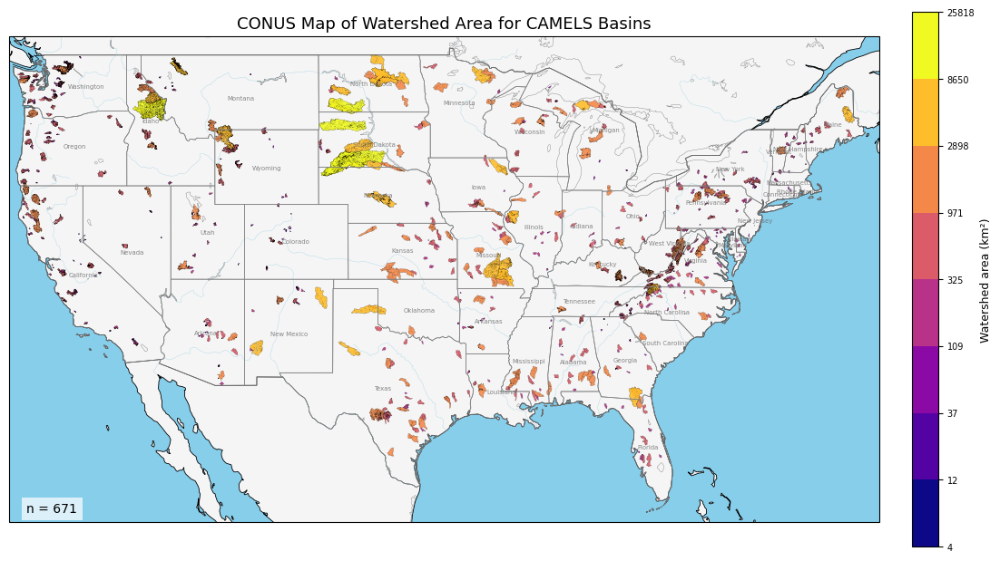

c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\Watershed_area.png
c:\Users\ppaudel2\OneDrive - The University of Alabama\Desktop\Python\Python\Jupyter Notebook\CAMELS Research\Final research code\Diagnostic Check of Long-Lag Tair TE Using MI and Time-Series Comparison for 3 CAMELS Basins\outputs\pdf\Watershed_area.pdf


In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.cm import get_cmap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

# Keep only basins with watershed area
plot_poly_gdf = basin_area_gdf.dropna(subset=["watershed_area_km2"]).copy()

print("Polygon rows to plot:", len(plot_poly_gdf))
print("Unique gauge IDs:", plot_poly_gdf["gauge_id"].nunique())
print("Current CRS:", plot_poly_gdf.crs)

# Reproject to lat/lon for Cartopy
plot_poly_gdf = plot_poly_gdf.to_crs(epsg=4326)

print("Reprojected CRS:", plot_poly_gdf.crs)
print("Bounds:", plot_poly_gdf.total_bounds)

# Output paths
OUT_PDF = Path.cwd() / "outputs" / "pdf"
OUT_PDF.mkdir(parents=True, exist_ok=True)

poly_png = OUT_PDF / "Watershed_area.png"
poly_pdf = OUT_PDF /"Watershed_area.pdf"

# Read US states shapefile
states_shp = shpreader.natural_earth(
    resolution="50m",
    category="cultural",
    name="admin_1_states_provinces"
)
states_reader = shpreader.Reader(states_shp)
state_records = list(states_reader.records())

exclude_names = {
    "Alaska", "Hawaii", "Puerto Rico",
    "American Samoa", "Guam", "Northern Mariana Islands",
    "United States Virgin Islands", "District of Columbia"
}

conus_states = []
for rec in state_records:
    attrs = rec.attributes
    admin = attrs.get("admin")
    name = attrs.get("name")
    if admin == "United States of America" and name not in exclude_names:
        conus_states.append(rec)

# Watershed-area classes
x = plot_poly_gdf["watershed_area_km2"].astype(float)

area_min = float(x.min())
area_max = float(x.max())

bounds = np.geomspace(area_min, area_max, 9)   # 8 classes
bounds = np.round(bounds, 2)

base_cmap = plt.colormaps["plasma"].resampled(len(bounds) - 1)
cmap = ListedColormap(base_cmap(np.arange(len(bounds) - 1)))
norm = BoundaryNorm(bounds, cmap.N)

# 6) Make figure
fig = plt.figure(figsize=(12, 7))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, facecolor="whitesmoke")
ax.add_feature(cfeature.OCEAN, facecolor="skyblue")
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, edgecolor="gray", facecolor="none", linewidth=0.3)
ax.add_feature(cfeature.RIVERS, edgecolor="lightblue", linewidth=0.3)

for rec in conus_states:
    ax.add_geometries(
        [rec.geometry],
        crs=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor="gray",
        linewidth=0.5
    )

for rec in conus_states:
    geom = rec.geometry
    pt = geom.representative_point()
    state_name = rec.attributes.get("name", "")
    ax.text(
        pt.x, pt.y, state_name,
        transform=ccrs.PlateCarree(),
        fontsize=5,
        color="dimgray",
        ha="center",
        va="center",
        alpha=0.8
    )

# basin polygons
plot_poly_gdf.plot(
    ax=ax,
    column="watershed_area_km2",
    cmap=cmap,
    norm=norm,
    linewidth=0.1,
    edgecolor="black",
    alpha=0.9,
    transform=ccrs.PlateCarree()
)

ax.set_title("CONUS Map of Watershed Area for CAMELS Basins", fontsize=13)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(
    sm,
    ax=ax,
    shrink=0.88,
    pad=0.03,
    boundaries=bounds,
    ticks=bounds,
    spacing="uniform"
)
cbar.set_label("Watershed area (km²)", fontsize=9)
cbar.ax.tick_params(labelsize=7)

ax.text(
    0.02, 0.02,
    f"n = {plot_poly_gdf['gauge_id'].nunique()}",
    transform=ax.transAxes,
    fontsize=10,
    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
)

plt.tight_layout()

fig.savefig(poly_png, dpi=300, bbox_inches="tight")

with PdfPages(poly_pdf) as pdf:
    pdf.savefig(fig, bbox_inches="tight")

plt.show()
plt.close(fig)

print(poly_png)
print(poly_pdf)